In [1]:
import warnings

import pandas as pd
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import os

from aesara import tensor as at
from matplotlib.patches import Ellipse, transforms
from scipy import stats

In [2]:
%config InlineBackend.figure_format = 'retina'
warnings.simplefilter(action="ignore", category=(FutureWarning, UserWarning))
RANDOM_SEED = 8927
np.random.seed(RANDOM_SEED)
az.style.use("arviz-darkgrid")
az.rcParams["stats.hdi_prob"] = 0.89
az.rcParams["stats.ic_scale"] = "deviance"
az.rcParams["stats.information_criterion"] = "waic"

In [3]:
def standardize(series):
    """Standardize a pandas series"""
    return (series - series.mean()) / series.std()

## Exercise 14M1

Repeat the café robot simulation from the beginning of the chapter. This time, set rho to zero, so that there is no correlation between intercepts and slopes. How does the posterior distribution of the correlation reflect this change in the underlying simulation?

------

Simulate again a population of cafes

In [4]:
a = 3.5  # average morning wait time
b = -1.0  # average difference afternoon wait time
sigma_a = 1.0  # std dev in intercepts
sigma_b = 0.5  # std dev in slopes
rho = 0  # correlation between intercepts and slopes

In [5]:
Mu = [a, b]

Remember how you can build the Sigma matrix in different ways

In [6]:
cov_ab = sigma_a * sigma_b * rho
Sigma = np.array([[sigma_a**2, cov_ab], [cov_ab, sigma_b**2]])
Sigma

array([[1.  , 0.  ],
       [0.  , 0.25]])

In [7]:
sigmas = [sigma_a, sigma_b]
Rho = np.matrix([[1, rho], [rho, 1]])

Sigma = np.diag(sigmas) * Rho * np.diag(sigmas)
Sigma

matrix([[1.  , 0.  ],
        [0.  , 0.25]])

In [8]:
N_cafes = 20

In [9]:
vary_effects = np.random.multivariate_normal(mean=Mu, cov=Sigma, size=N_cafes)

In [10]:
a_cafe = vary_effects[:, 0]
b_cafe = vary_effects[:, 1]

In [11]:
def Gauss2d(mu, cov, ci, ax=None):
    """Copied from statsmodel"""
    if ax is None:
        _, ax = plt.subplots(figsize=(6, 6))

    v_, w = np.linalg.eigh(cov) #eigenvalues and eigenvectors
    u = w[0] / np.linalg.norm(w[0])
    angle = np.arctan(u[1] / u[0])
    angle = 180 * angle / np.pi  # convert to degrees

    for level in ci:
        v = 2 * np.sqrt(v_ * stats.chi2.ppf(level, 2))  # get size corresponding to level
        ell = Ellipse( 
            mu[:2],
            v[0],
            v[1],
            angle = 180 + angle,
            facecolor="None",
            edgecolor="k",
            alpha=max(1 - level,.1),
            lw=1.5,
        )
        ell.set_clip_box(ax.bbox)
        #ell.set_alpha(0.5)
        ax.add_artist(ell)

    return ax

plotting intercepts and slopes. The relationship higlights how cafes with long waiting times (large a's) usually have a lot of improvement in the afternoon (a shorter waiting time). Correlation in the a and b parameters is lost now.

/scratch/28243578/ipykernel_864972/2330047673.py:8: RuntimeWarning: divide by zero encountered in double_scalars
  angle = np.arctan(u[1] / u[0])


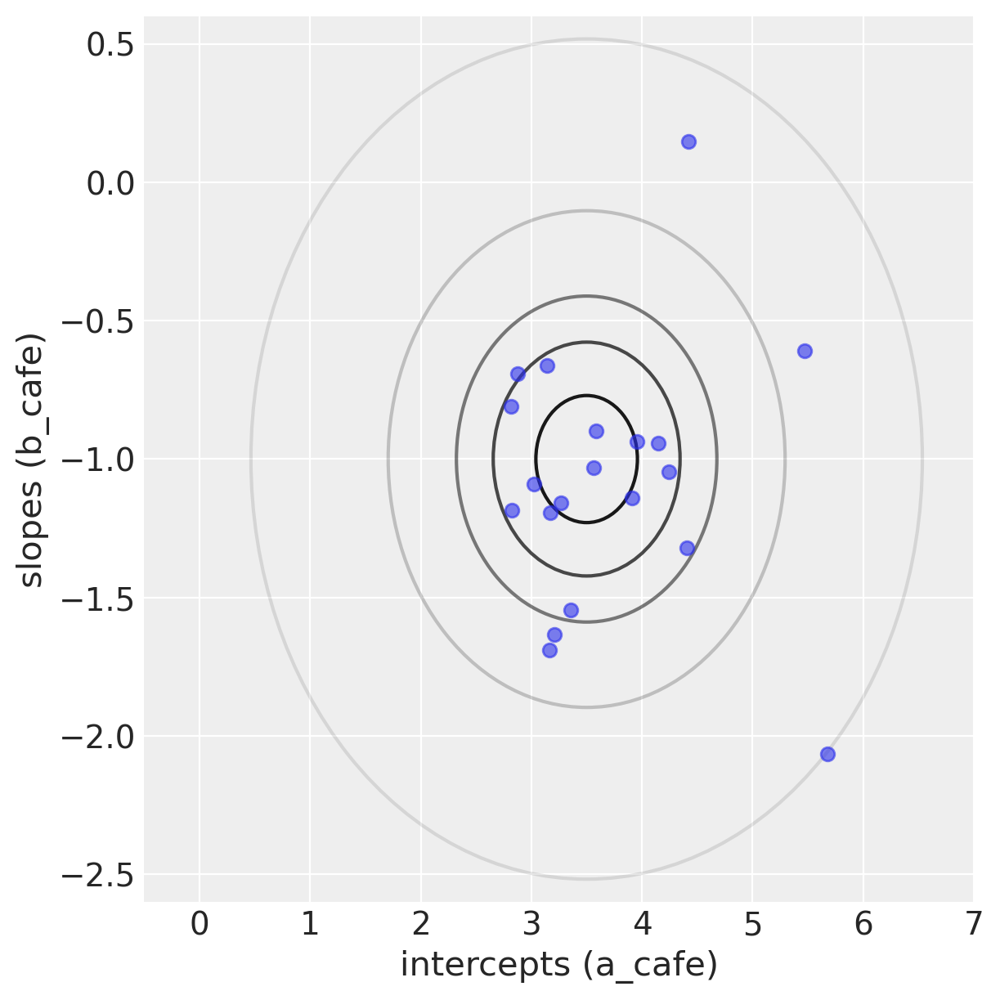

In [12]:
ax = Gauss2d(Mu, np.asarray(Sigma), [0.1, 0.3, 0.5, 0.8, 0.99])
ax.scatter(a_cafe, b_cafe, alpha=0.6)
ax.set_xlim(-0.5, 7)
ax.set_ylim(-2.6, 0.6)
ax.set_xlabel("intercepts (a_cafe)")
ax.set_ylabel("slopes (b_cafe)");

Above were simulations of cafes and the full description of their properties (through simulated intercepts and slopes). Below we simulate visits to cafes.

In [13]:
N_visits = 10
afternoon = np.tile([0, 1], N_visits * N_cafes // 2)  # wrap with int() to suppress warnings
cafe_id = np.repeat(np.arange(0, N_cafes), N_visits)  # 1-20 (minus 1 for python indexing)

mu = a_cafe[cafe_id] + b_cafe[cafe_id] * afternoon
sigma = 0.5  # std dev within cafes

wait = np.random.normal(loc=mu, scale=sigma, size=N_visits * N_cafes)
d = pd.DataFrame(dict(cafe=cafe_id, afternoon=afternoon, wait=wait))
d

,cafe,afternoon,wait
0,0,0,2.824015
1,0,1,1.804069
2,0,0,2.893324
3,0,1,0.935652
4,0,0,4.149596
...,...,...,...
195,19,1,1.868736
196,19,0,3.666390
197,19,1,1.158664
198,19,0,3.352406


Building the model

In [14]:
cafe_idx = d["cafe"].values
with pm.Model() as m14_1:
    # LKJCholeskyCov is more efficient than LKJCorr
    # PyMC >= 3.9 extracts the stds and matrix of correlations automatically for us
    # the distribution of standard deviations is included as an option because the
    # functions also calculates correlation within cafes to output the matrix
    chol, Rho_, sigma_cafe = pm.LKJCholeskyCov(
        "chol_cov", n=2, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True
    )

    a = pm.Normal("a", 5.0, 2.0)  # prior for average intercept
    b = pm.Normal("b", -1.0, 0.5)  # prior for average slope
    ab_cafe = pm.MvNormal(
        "ab_cafe", mu=at.stack([a, b]), chol=chol, shape=(N_cafes, 2)
    )  # population of varying effects
    # shape needs to be (N_cafes, 2) because we're getting back both a and b for each cafe

    mu = ab_cafe[cafe_idx, 0] + ab_cafe[cafe_idx, 1] * d["afternoon"].values  # linear model
    sigma_within = pm.Exponential("sigma_within", 1.0)  # prior stddev within cafes

    wait = pm.Normal("wait", mu=mu, sigma=sigma_within, observed=d["wait"].values)  # likelihood
    if(not os.path.exists('trace_14m1.nc')):
        trace_14m1 = pm.sample(4000, tune=4000, target_accept=0.9)
        trace_14m1.rename({"chol_cov_corr": "Rho", "chol_cov_stds": "sigma_cafe"}, inplace=True)
        az.InferenceData.to_netcdf(trace_14m1, 'trace_14m1.nc')
        


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, a, b, ab_cafe, sigma_within]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 443 seconds.


In [15]:
#az.InferenceData.to_netcdf(trace_14_1, 'trace_14_1.nc')
trace_14m1 = az.from_netcdf('trace_14m1.nc')

post = trace_14m1.posterior

For complex models it is always good to do more checks:

In [17]:
az.summary(trace_14m1, var_names=["a", "b", "sigma_within", "Rho", "sigma_cafe"], round_to=2)

/faststorage/project/sandbox_scrna_course/Repo/bayesian_statistics/statistical_rethinking_2/pymc4/pymc4_env2/lib/python3.10/site-packages/arviz/stats/diagnostics.py:584: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,3.72,0.18,3.43,4.01,0.0,0.0,19410.95,12603.63,1.0
b,-1.08,0.13,-1.29,-0.88,0.0,0.0,15477.91,13254.33,1.0
sigma_within,0.55,0.03,0.50,0.60,0.0,0.0,17598.61,12506.80,1.0
"Rho[0, 0]",1.00,0.00,1.00,1.00,0.0,0.0,16000.00,16000.00,NaN
"Rho[0, 1]",0.16,0.26,-0.23,0.61,0.0,0.0,9679.39,9691.82,1.0
"Rho[1, 0]",0.16,0.26,-0.23,0.61,0.0,0.0,9679.39,9691.82,1.0
"Rho[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,15725.60,15581.43,1.0
sigma_cafe[0],0.77,0.14,0.55,0.98,0.0,0.0,17796.39,12746.37,1.0
sigma_cafe[1],0.46,0.13,0.26,0.66,0.0,0.0,5181.51,5167.68,1.0


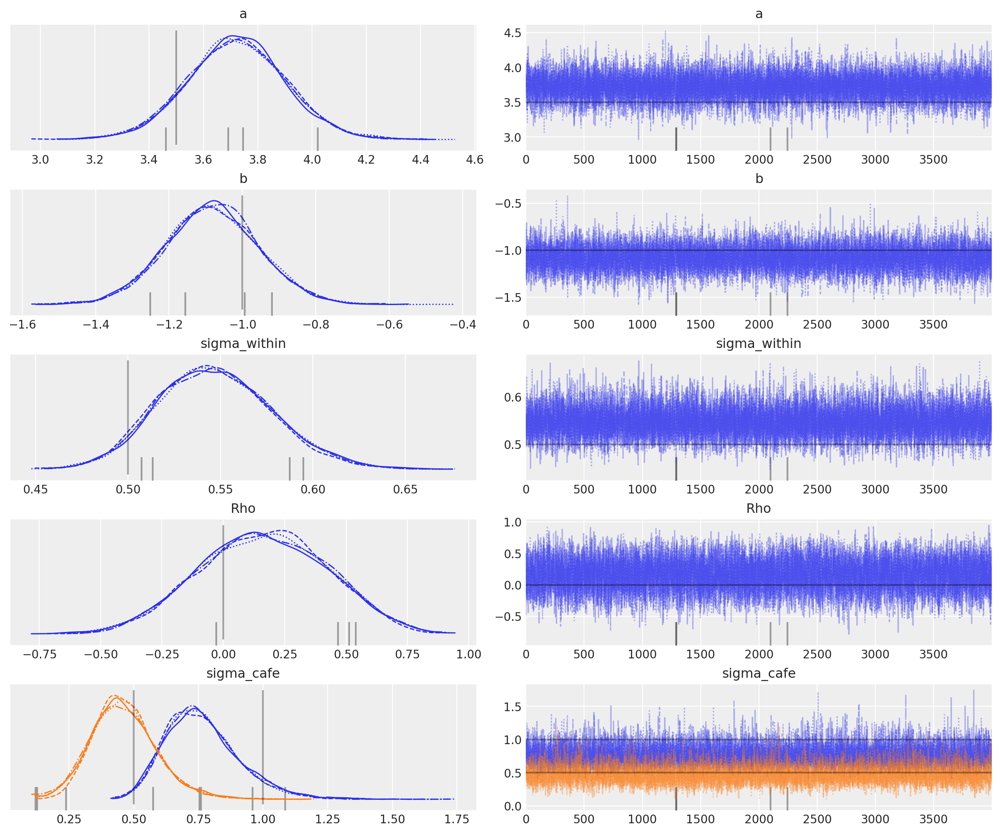

In [18]:
az.plot_trace(
    trace_14m1,
    compact=True,
    var_names=["~ab_cafe", "~chol_cov"],
    coords={"chol_cov_corr_dim_0": 1, #Takes second element of first row in correlation matrix
            "chol_cov_corr_dim_1": 0}, #Takes first element of second row in correlation matrix
    lines=[
        ("a", {}, Mu[0]),
        ("b", {}, Mu[1]),
        ("sigma_cafe", {}, sigmas),
        ("Rho", {}, Rho[0, 1]),
        ("sigma_within", {}, sigma),
    ],
);

Prior and posterior for the correlation coefficient, inferred only from the waiting times resulting from the model of cafe's!!!

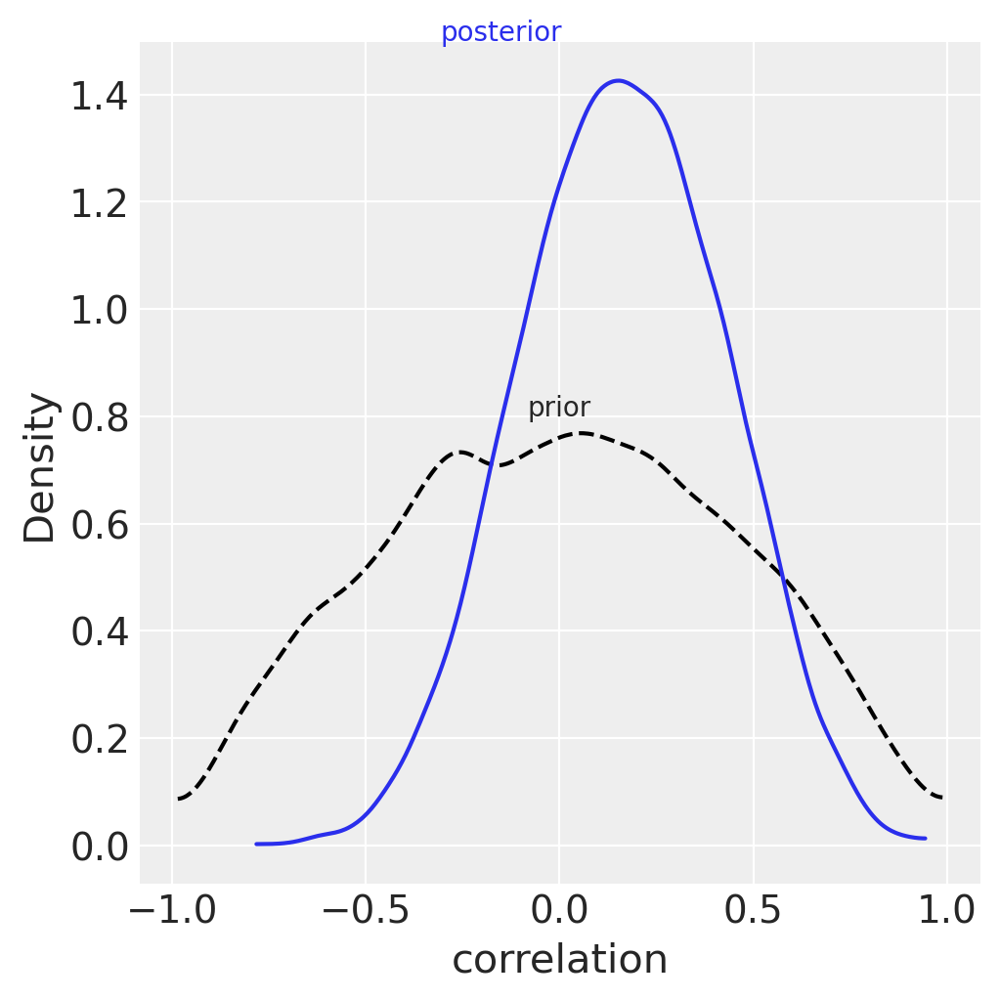

In [19]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))

R = pm.LKJCorr.dist(n=2, eta=2, size=10000).eval()
az.plot_kde(R, plot_kwargs={"color": "k", "linestyle": "--"})
ax.text(0, 0.8, "prior", horizontalalignment="center")

az.plot_kde(
    np.array(
        az.extract_dataset(post["Rho"].sel(chol_cov_corr_dim_0=1, chol_cov_corr_dim_1=0)).to_array()
    ),
    ax=ax,
    plot_kwargs={"color": "C0"},
)
ax.text(-0.15, 1.5, "posterior", color="C0", horizontalalignment="center")

ax.set_xlabel("correlation")
ax.set_ylabel("Density");

In [20]:
# compute unpooled estimates directly from data
a1b1 = d.groupby(["afternoon", "cafe"]).agg("mean").unstack(level=0).values
a1 = a1b1[:, 0]
b1 = a1b1[:, 1] - a1 # in the afternoon data generated you have the sum of a and b, so you need only b

# extract posterior means of partially pooled estimates
a2b2 = post["ab_cafe"].mean(dim=("chain", "draw"))
a2 = a2b2[:, 0]
b2 = a2b2[:, 1]

# compute posterior mean bivariate Gaussian
ab = post[["a", "b"]].mean(dim=("chain", "draw"))
Mu_est = np.array([ab["a"], ab["b"]])
chol_model = pm.expand_packed_triangular(
    2, post["chol_cov"].mean(dim=("chain", "draw")).to_numpy(), lower=True
).eval()
Sigma_est = np.dot(chol_model, chol_model.T)

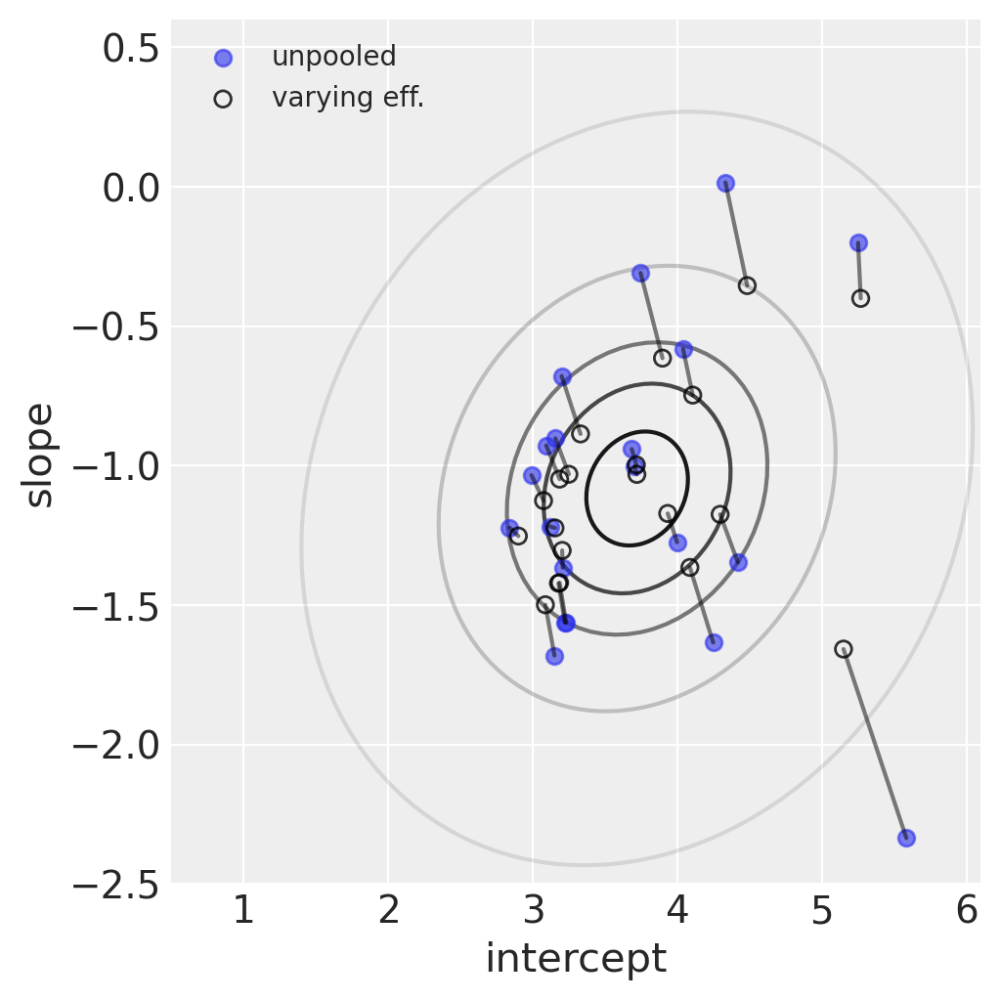

In [21]:
# draw contours
_, ax = plt.subplots(1, 1, figsize=(5, 5))
_ = Gauss2d(mu=Mu_est, cov=np.asarray(Sigma_est), ci=[0.1, 0.3, 0.5, 0.8, 0.99], ax=ax)

# plot both and connect with lines
ax.scatter(a1, b1, label="unpooled", alpha=0.6)
ax.scatter(a2, b2, label="varying eff.", facecolors="none", edgecolors="k", lw=1, alpha=0.8)

ax.plot([a1, a2], [b1, b2], "k-", alpha=0.5)
ax.set_xlabel("intercept")
ax.set_ylabel("slope")
ax.set_xlim(0.5, 6.1)
ax.set_ylim(-2.5, 0.6)
plt.legend(fontsize=10);

In [22]:
# convert varying effects to waiting times
wait_morning_1 = a1
wait_afternoon_1 = a1 + b1
wait_morning_2 = a2
wait_afternoon_2 = a2 + b2

# now shrinkage distribution by simulation
v = np.random.multivariate_normal(mean=Mu_est, cov=Sigma_est, size=1000)
v[:, 1] = v[:, 0] + v[:, 1]  # calculate afternoon wait
Sigma_est2 = np.cov(v.T)
Mu_est2 = Mu_est.copy()
Mu_est2[1] = Mu_est[0] + Mu_est[1]

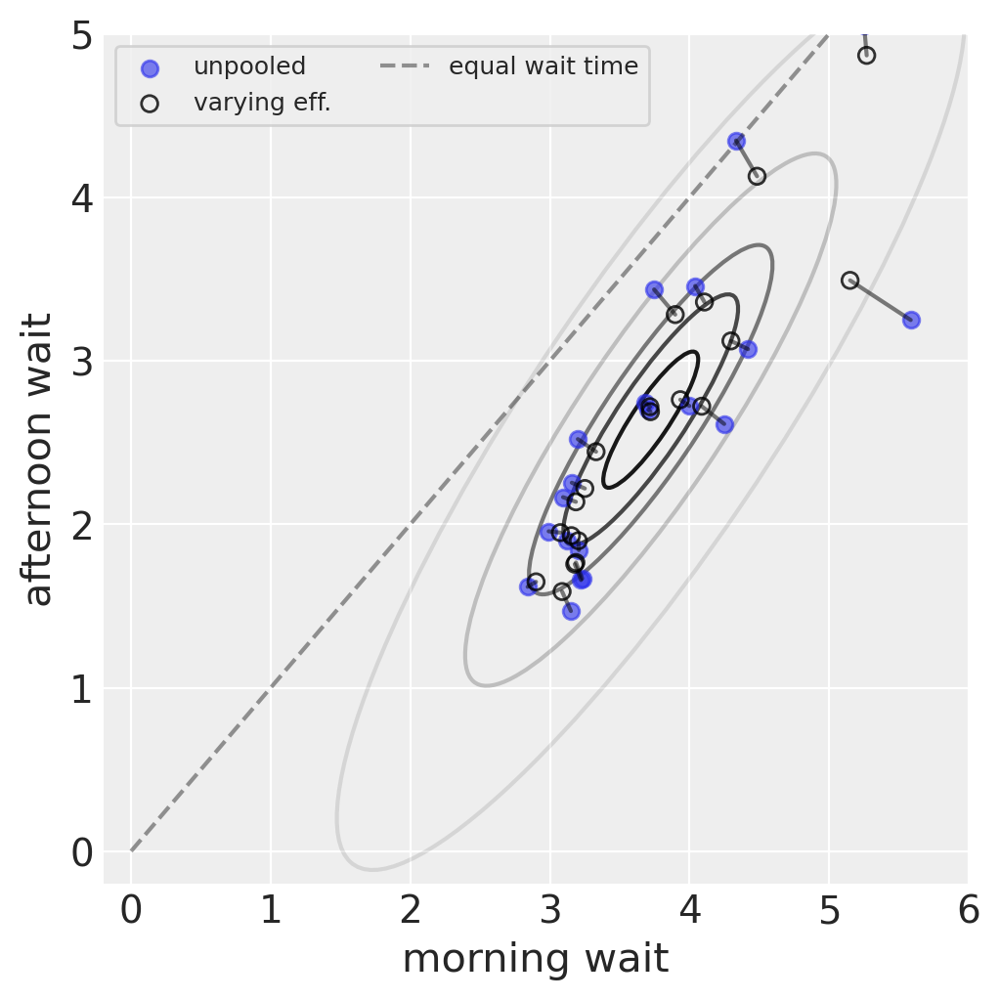

In [23]:
# draw contours
_, ax = plt.subplots(1, 1, figsize=(5, 5))
_ = Gauss2d(mu=Mu_est2, cov=np.asarray(Sigma_est2), ci=[0.1, 0.3, 0.5, 0.8, 0.99], ax=ax)

# plot both and connect with lines
ax.scatter(wait_morning_1, wait_afternoon_1, label="unpooled", alpha=0.6)
ax.scatter(
    wait_morning_2,
    wait_afternoon_2,
    label="varying eff.",
    facecolors="none",
    edgecolors="k",
    lw=1,
    alpha=0.8,
)

ax.plot(
    [wait_morning_1, wait_morning_2],
    [wait_afternoon_1, wait_afternoon_2],
    "k-",
    alpha=0.5,
)
ax.plot(range(6), range(6), "k--", label="equal wait time", alpha=0.4)
ax.set_xlabel("morning wait")
ax.set_ylabel("afternoon wait")
ax.set_xlim(-0.2, 6)
ax.set_ylim(-0.2, 5)
plt.legend(fontsize=9, ncol=2, loc="upper left", frameon=True);

## Advanced Varying Slopes

From the chimpanzee experiment. Now we want to have pooling across actors and across experimental blocks. The indexing is done also across the various treatments, since we want to model each of the fours treatments (prosocial or not, left or right = 4 treatments in total).

#### Code 14.18

In [4]:
d = pd.read_csv("Data/chimpanzees.csv", sep=";")

d["treatment"] = d.prosoc_left + 2 * d.condition
tid_ = d.treatment.values
Ntreatments = len(np.unique(tid_))

d["actor"] = d.actor - 1
actor_ = d.actor.astype(int).values
Nactors = len(np.unique(actor_))

d["block"] = d.block - 1
block_id_ = d.block.astype(int).values
Nblocks = len(np.unique(block_id_))

In [5]:
d.head()

,actor,recipient,condition,block,trial,prosoc_left,chose_prosoc,pulled_left,treatment
0,0,NaN,0,0,2,0,1,0,0
1,0,NaN,0,0,4,0,0,1,0
2,0,NaN,0,0,6,1,0,0,1
3,0,NaN,0,0,8,0,1,0,0
4,0,NaN,0,0,10,1,1,1,1


In [6]:
with pm.Model() as m14_2:
    # fixed priors
    g = pm.Normal("g", 0.0, 1.0, shape=Ntreatments)
    sd_dist = pm.Exponential.dist(1.0)
    chol_actor, _, _ = pm.LKJCholeskyCov(
        "chol_actor", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    chol_block, _, _ = pm.LKJCholeskyCov(
        "chol_block", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )

    # adaptive priors
    alpha = pm.MvNormal("alpha", mu=0.0, chol=chol_actor, shape=(Nactors, Ntreatments))
    beta = pm.MvNormal("beta", mu=0.0, chol=chol_block, shape=(Nblocks, Ntreatments))

    # for posterior predictions
    actor = pm.Data("actor", actor_, mutable=True)
    block_id = pm.Data("block_id", block_id_, mutable=True)
    tid = pm.Data("tid", tid_, mutable=True)

    p = pm.math.invlogit(g[tid] + alpha[actor, tid] + beta[block_id, tid])
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    if(not os.path.exists('trace_14_2.nc')):
        trace_14_2 = pm.sample(2000, tune=2000, random_seed=RANDOM_SEED)
        trace_14_2.rename(
            {
            "chol_actor_corr": "Rho_actor",
            "chol_actor_stds": "sigma_actor",
            "chol_block_corr": "Rho_block",
            "chol_block_stds": "sigma_block",
            },
            inplace=True,
        )
        az.InferenceData.to_netcdf(trace_14_2, 'trace_14_2.nc')

#### Code 14.19

In [7]:
with pm.Model() as m14_3:
    # fixed priors
    g = pm.Normal("g", 0.0, 1.0, shape=Ntreatments)
    sd_dist = pm.Exponential.dist(1.0)
    chol_actor, _, _ = pm.LKJCholeskyCov(
        "chol_actor", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    chol_block, _, _ = pm.LKJCholeskyCov(
        "chol_block", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )

    # adaptive priors non-centered
    z_actor = pm.Normal("z_actor", 0.0, 1.0, shape=(Ntreatments, Nactors))
    alpha = pm.Deterministic("alpha", pm.math.dot(chol_actor, z_actor))
    z_block = pm.Normal("z_block", 0.0, 1.0, shape=(Ntreatments, Nblocks))
    beta = pm.Deterministic("beta", pm.math.dot(chol_block, z_block))

    # for posterior predictions
    actor = pm.Data("actor", actor_, mutable=True)
    block_id = pm.Data("block_id", block_id_, mutable=True)
    tid = pm.Data("tid", tid_, mutable=True)

    p = pm.Deterministic("p", pm.math.invlogit(g[tid] + alpha[tid, actor] + beta[tid, block_id]))
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    if(not os.path.exists('trace_14_3.nc')):
        trace_14_3 = pm.sample(4000, tune=4000, target_accept=0.9, random_seed=RANDOM_SEED)
        trace_14_3.rename(
            {
            "chol_actor_corr": "Rho_actor",
            "chol_actor_stds": "sigma_actor",
            "chol_block_corr": "Rho_block",
            "chol_block_stds": "sigma_block",
            },
            inplace=True,
        )
        az.InferenceData.to_netcdf(trace_14_3, 'trace_14_3.nc')

In [8]:
trace_14_2 = az.from_netcdf('trace_14_2.nc')

In [9]:
trace_14_3 = az.from_netcdf('trace_14_3.nc')

#### Code 14.20

calculate diagnostic summaries for the centered and non-centered model. The non-centered one is going to be much more efficient (mean ess higher than in the centered model)

In [10]:
m_14_2 = az.summary(trace_14_2, var_names=["alpha", "beta"], kind="diagnostics", round_to=2)[
    "ess_bulk"
]
m_14_2.name = "m14_2"

m_14_3 = az.summary(trace_14_3, var_names=["alpha", "beta"], kind="diagnostics", round_to=2)[
    "ess_bulk"
]
m_14_3.name = "m14_3"

ess_mean = pd.concat([m_14_2, m_14_3], axis=1, sort=True)

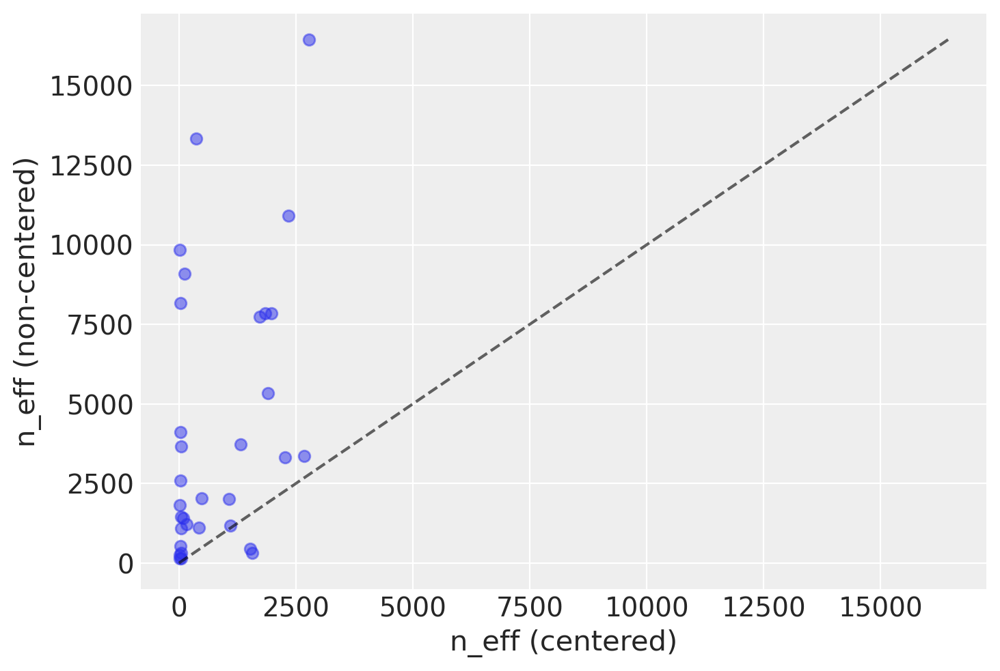

In [11]:
plt.plot(ess_mean.m14_2.values, ess_mean.m14_3.values, "o", alpha=0.5)

max_val = ess_mean.max().max()
plt.plot(np.arange(max_val), np.arange(max_val), "k--", alpha=0.6)

plt.xlabel("n_eff (centered)")
plt.ylabel("n_eff (non-centered)");

#### Code 14.21

The shrinking given by the pooling is quite strong. Here you can see it by looking at the small standard deviations of pooled actors and blocks.

In [12]:
az.summary(trace_14_3, var_names="sigma", filter_vars="like", round_to=2)

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma_actor[0],1.41,0.49,0.66,2.05,0.01,0.01,2424.02,9696.02,1.00
sigma_actor[1],0.92,0.42,0.29,1.49,0.01,0.01,1714.37,4403.67,1.00
sigma_actor[2],1.84,0.57,1.05,2.67,0.01,0.01,3097.14,5772.86,1.00
sigma_actor[3],1.60,0.61,0.75,2.43,0.01,0.01,3546.57,7312.30,1.00
sigma_block[0],0.39,0.32,0.00,0.79,0.01,0.00,1649.73,5389.00,1.00
sigma_block[1],0.44,0.34,0.01,0.84,0.01,0.01,2590.80,2578.95,1.00
sigma_block[2],0.29,0.27,0.00,0.61,0.01,0.01,546.24,226.35,1.01
sigma_block[3],0.47,0.37,0.01,0.92,0.01,0.01,149.28,22.09,1.02


#### Code 14.22

Plotting predictions and observed data. Note how not only the averages are important (the dots in the plot), but it is relevant to have a distribution of responses to understand which intervals the outcomes can cover.

In [13]:
# compute mean for each actor in each treatment
pl = d.groupby(["actor", "treatment"]).agg("mean")["pulled_left"].unstack()
pl_val = pl.stack().values
pl

treatment,0,1,2,3
actor,,,,
0,0.333333,0.500000,0.277778,0.555556
1,1.000000,1.000000,1.000000,1.000000
2,0.277778,0.611111,0.166667,0.333333
3,0.333333,0.500000,0.111111,0.444444
4,0.333333,0.555556,0.277778,0.500000
5,0.777778,0.611111,0.555556,0.611111
6,0.777778,0.833333,0.944444,1.000000


In [14]:
# generate posterior predictions
with m14_3:
    pm.set_data(
        {
            "actor": np.repeat(range(7), 4),
            "block_id": np.repeat(4, 4 * 7),
            "tid": list(range(4)) * 7,
        }
    )
    post_pred = pm.sample_posterior_predictive(trace_14_3, random_seed=RANDOM_SEED, var_names="p")
    p_post = post_pred["posterior_predictive"]["p"]
p_mu = np.array(p_post.mean(dim=["chain", "draw"])).reshape((7, 4))

Sampling: []


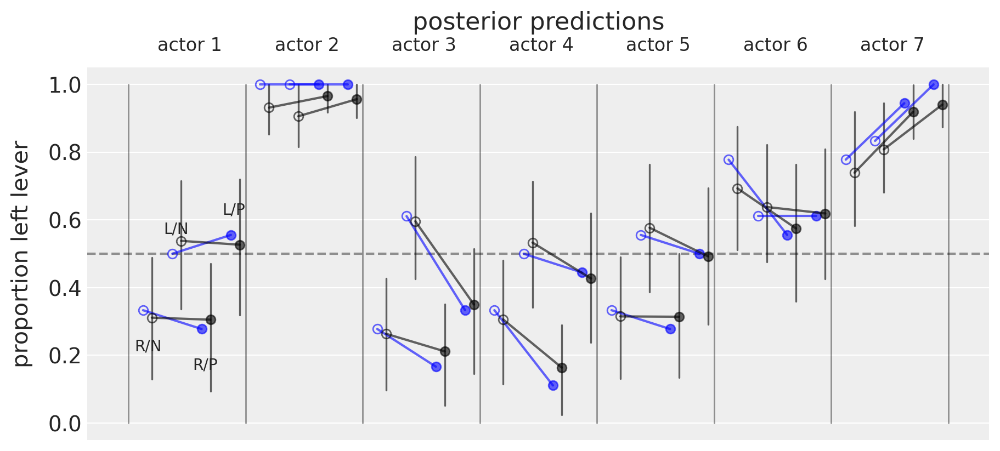

In [15]:
# set up plot
_, ax = plt.subplots(1, 1, figsize=(9, 4), constrained_layout=True)
alpha, xoff, yoff = 0.6, 0.3, 0.06

ax.plot(
    [np.arange(28) + xoff, np.arange(28) + xoff],
    np.array(az.hdi(p_post).to_array())[0].T,
    "k-",
    lw=1.2,
    alpha=alpha,
)
ax.plot([7 * 4 - 0.5] * 2, [0, 1], c="k", alpha=0.4, lw=1)
ax.axhline(0.5, ls="--", c="k", alpha=0.4)

for actor in range(Nactors):
    # raw data
    ax.plot(
        [actor * 4, actor * 4 + 2],
        [pl.loc[actor, 0], pl.loc[actor, 2]],
        "-",
        c="b",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 1, actor * 4 + 3],
        [pl.loc[actor, 1], pl.loc[actor, 3]],
        "-",
        c="b",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4, actor * 4 + 1],
        [pl.loc[actor, 0], pl.loc[actor, 1]],
        "o",
        c="b",
        fillstyle="none",
        ms=6,
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 2, actor * 4 + 3],
        [pl.loc[actor, 2], pl.loc[actor, 3]],
        "o",
        c="b",
        ms=6,
        alpha=alpha,
    )
    # posterior predictions
    ax.plot(
        [actor * 4 + xoff, actor * 4 + 2 + xoff],
        [p_mu[actor, 0], p_mu[actor, 2]],
        "-",
        c="k",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 1 + xoff, actor * 4 + 3 + xoff],
        [p_mu[actor, 1], p_mu[actor, 3]],
        "-",
        c="k",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + xoff, actor * 4 + 1 + xoff],
        [p_mu[actor, 0], p_mu[actor, 1]],
        "o",
        c="k",
        fillstyle="none",
        ms=6,
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 2 + xoff, actor * 4 + 3 + xoff],
        [p_mu[actor, 2], p_mu[actor, 3]],
        "o",
        c="k",
        ms=6,
        alpha=alpha,
    )
    ax.plot([actor * 4 - 0.5] * 2, [0, 1], c="k", alpha=0.4, lw=1)
    ax.text(actor * 4 + 0.5, 1.1, f"actor {actor + 1}", fontsize=12)

    if actor == 0:
        ax.text(actor * 4 - xoff, pl.loc[actor, 0] - 2 * yoff, "R/N")
        ax.text(actor * 4 + 1 - xoff, pl.loc[actor, 1] + yoff, "L/N")
        ax.text(actor * 4 + 2 - xoff, pl.loc[actor, 2] - 2 * yoff, "R/P")
        ax.text(actor * 4 + 3 - xoff, pl.loc[actor, 3] + yoff, "L/P")

ax.set_xticks([])
ax.set_ylabel("proportion left lever", labelpad=10)
ax.set_title("posterior predictions", pad=25);

## Instrumental variables

#### Code 14.23
A model with Q representing season of birth, influencing E (education) which influences W (wage). U is a confounder. For simplicity the effect of age is 0. 

In [16]:
N = 500
U_sim = np.random.normal(size=N)
Q_sim = np.random.randint(1, 5, N)
E_sim = np.random.normal(loc=U_sim + Q_sim, size=N)
W_sim = np.random.normal(loc=U_sim + 0 * E_sim, size=N)
dat_sim = pd.DataFrame.from_dict(
    {"W": standardize(W_sim), "E": standardize(E_sim), "Q": standardize(Q_sim)}
)
dat_sim.head()

,W,E,Q
0,-0.716876,-1.874122,-1.296704
1,-1.528818,-2.237535,-1.296704
2,-0.057729,0.225430,-1.296704
3,0.586142,0.822406,0.450875
4,0.454206,-0.527773,-1.296704


#### Code 14.24
just regressing wage with education. The effect of education is positive due to the confounder U.

In [17]:
with pm.Model() as m14_4:
    aW = pm.Normal("aW", 0.0, 0.2)
    bEW = pm.Normal("bEW", 0.0, 0.5)

    mu = aW + bEW * dat_sim.E.values
    sigma = pm.Exponential("sigma", 1.0)

    W_obs = pm.Data("W_obs", dat_sim.W.values, mutable=True)
    W = pm.Normal("W", mu, sigma, observed=W_obs)

    trace_14_4 = pm.sample(random_seed=RANDOM_SEED)
az.summary(trace_14_4, round_to=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, bEW, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
aW,0.00,0.04,-0.06,0.06,0.0,0.0,5405.40,3009.13,1.0
bEW,0.45,0.04,0.38,0.51,0.0,0.0,6053.69,2790.47,1.0
sigma,0.90,0.03,0.85,0.94,0.0,0.0,6413.39,3343.67,1.0


#### Code 14.25
Here we add Q to the model. This will amplify the bias because there is a noncausal path Q->E<-U->W with E observed (closed path). This means that adding Q will amplify the confounding effect of U.

In [18]:
with pm.Model() as m14_5:
    aW = pm.Normal("aW", 0.0, 0.2)
    bEW = pm.Normal("bEW", 0.0, 0.5)
    bQW = pm.Normal("bQW", 0.0, 0.5)

    mu = aW + bEW * dat_sim.E.values + bQW * dat_sim.Q.values
    sigma = pm.Exponential("sigma", 1.0)

    W = pm.Normal("W", mu, sigma, observed=dat_sim.W.values)

    trace_14_5 = pm.sample(random_seed=RANDOM_SEED)
az.summary(trace_14_5, round_to=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, bEW, bQW, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
aW,0.00,0.04,-0.06,0.06,0.0,0.0,3958.60,3260.89,1.0
bEW,0.68,0.05,0.61,0.76,0.0,0.0,2500.69,3013.02,1.0
bQW,-0.39,0.05,-0.47,-0.32,0.0,0.0,2827.70,2857.70,1.0
sigma,0.84,0.03,0.80,0.88,0.0,0.0,4392.55,3352.92,1.0


#### Code 14.26
Here we use Q properly as instrumental variable influencing E, and separately we model the relationship of E influencing W. The two linear models are put in relationship with a multivariate normal, so that 

In [19]:
with pm.Model() as m14_6:
    aW = pm.Normal("aW", 0.0, 0.2)
    aE = pm.Normal("aE", 0.0, 0.2)
    bEW = pm.Normal("bEW", 0.0, 0.5)
    bQE = pm.Normal("bQE", 0.0, 0.5)

    muW = aW + bEW * dat_sim.E.values
    muE = aE + bQE * dat_sim.Q.values
    chol, _, _ = pm.LKJCholeskyCov(
        "chol_cov", n=2, eta=2, sd_dist=pm.Exponential.dist(1.0), compute_corr=True
    )

    WE_obs = pm.Data("WE_obs", dat_sim[["W", "E"]].values, mutable=True)
    WE = pm.MvNormal("WE", mu=at.stack([muW, muE]).T, chol=chol, observed=WE_obs)

    if(not os.path.exists('trace_14_6.nc')):
        trace_14_6 = pm.sample(2000, random_seed=RANDOM_SEED)
        trace_14_6.rename({"chol_cov_corr": "Rho", "chol_cov_stds": "Sigma"}, inplace=True)
        az.InferenceData.to_netcdf(trace_14_6, 'trace_14_6.nc')

In [20]:
trace_14_6 = az.from_netcdf('trace_14_6.nc')

In [21]:
az.summary(trace_14_6, var_names=["aW", "aE", "bEW", "bQE", "Rho", "Sigma"], round_to=2)

/work/home/SamueleSoraggi#7953/Repositories/bayesian_statistics/statistical_rethinking_2/pymc4/pymc4_env_2/lib/python3.10/site-packages/arviz/stats/diagnostics.py:584: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
aW,-0.00,0.04,-0.06,0.07,0.0,0.0,7220.47,5598.00,1.0
aE,0.00,0.03,-0.05,0.05,0.0,0.0,7030.25,5955.54,1.0
bEW,0.05,0.07,-0.07,0.16,0.0,0.0,3439.58,4415.86,1.0
bQE,0.61,0.04,0.55,0.67,0.0,0.0,5776.15,5758.36,1.0
"Rho[0, 0]",1.00,0.00,1.00,1.00,0.0,0.0,8000.00,8000.00,NaN
"Rho[0, 1]",0.51,0.05,0.43,0.60,0.0,0.0,3702.76,4173.17,1.0
"Rho[1, 0]",0.51,0.05,0.43,0.60,0.0,0.0,3702.76,4173.17,1.0
"Rho[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,7497.82,7464.45,1.0
Sigma[0],0.98,0.04,0.91,1.05,0.0,0.0,4189.46,4720.56,1.0
Sigma[1],0.79,0.02,0.75,0.83,0.0,0.0,9785.88,6562.59,1.0


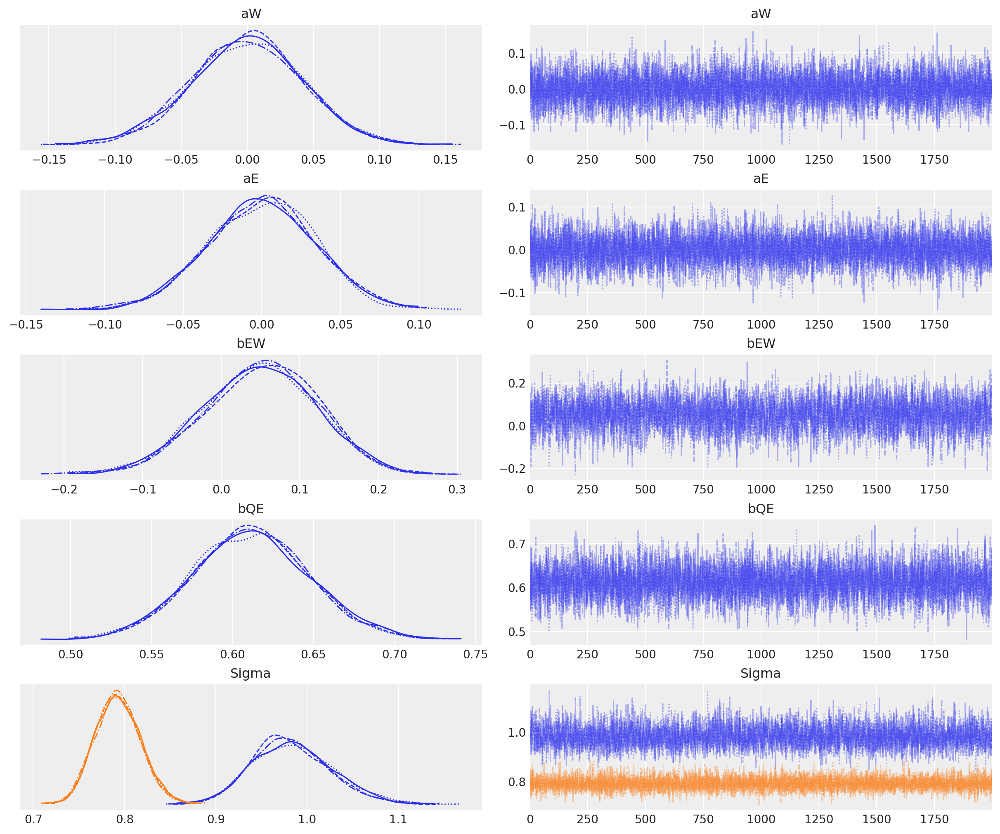

In [22]:
# Not displaying Rho variable as it causes error
az.plot_trace(trace_14_6, var_names=["aW", "aE", "bEW", "bQE", "Sigma"], compact=True);

#### Code 14.27

Code to test other models you wish to simulate with different values for W and E

In [23]:
#with m14_4:
#    pm.set_data({"W_obs": dat_sim.W.values})  # replace `dat_sim.W` with new obs
#    trace_14_4x = pm.sample(random_seed=RANDOM_SEED)
#with m14_6:
#    pm.set_data(
#        {"WE_obs": dat_sim[["W", "E"]].values}
#    )  # replace `dat_sim[["W", "E"]].values` with new obs
#    if(not os.path.exists('trace_14_6x.nc')):
#        trace_14_6x = pm.sample(2000, random_seed=RANDOM_SEED)
#        az.InferenceData.to_netcdf(trace_14_6x, 'trace_14_6x.nc')

In [24]:
#trace_14_6x = az.from_netcdf('trace_14_6x.nc')

#### Code 14.28

Now data is simulated differently, with U compensating negatively for the positive effect of E

In [25]:
N = 500
U_sim = np.random.normal(size=N)
Q_sim = np.random.randint(1, 5, N)
E_sim = np.random.normal(loc=U_sim + Q_sim, size=N)
W_sim = np.random.normal(loc=-U_sim + 0.2 * E_sim, size=N)
dat_sim2 = pd.DataFrame.from_dict(
    {"W": standardize(W_sim), "E": standardize(E_sim), "Q": standardize(Q_sim)}
)
dat_sim2.head()

,W,E,Q
0,0.615649,-0.442994,-1.277258
1,0.068766,0.271918,1.332942
2,0.968147,0.642637,0.462875
3,0.872208,2.037869,1.332942
4,0.750804,-0.216989,1.332942


In [26]:
with m14_4:
    pm.set_data({"W_obs": dat_sim2.W.values})
    trace_14_4x = pm.sample(random_seed=RANDOM_SEED)

with m14_6:
    pm.set_data({"WE_obs": dat_sim2[["W", "E"]].values})
    if(not os.path.exists('trace_14_6xx.nc')):
        trace_14_6xx = pm.sample(2000, random_seed=RANDOM_SEED)
        trace_14_6xx.posterior = trace_14_6xx.posterior.rename_vars(
            {"chol_cov_corr": "Rho", "chol_cov_stds": "Sigma"})
        az.InferenceData.to_netcdf(trace_14_6xx, 'trace_14_6xx.nc')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, bEW, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aW, aE, bEW, bQE, chol_cov]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 896 seconds.


In [27]:
trace_14_6xx = az.from_netcdf('trace_14_6xx.nc')

here we observe negative correlation between the residuals of E and W, since there is positive influence of U on E and negative on W.

In [29]:
az.summary(trace_14_6xx, var_names=["aW", "aE", "bEW", "bQE", "Rho", "Sigma"], round_to=2)

/work/home/SamueleSoraggi#7953/Repositories/bayesian_statistics/statistical_rethinking_2/pymc4/pymc4_env_2/lib/python3.10/site-packages/arviz/stats/diagnostics.py:584: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
aW,0.00,0.04,-0.07,0.07,0.0,0.0,9821.54,6644.52,1.0
aE,0.00,0.04,-0.07,0.07,0.0,0.0,9645.32,6077.36,1.0
bEW,-0.03,0.04,-0.10,0.04,0.0,0.0,12281.35,6582.55,1.0
bQE,0.06,0.04,-0.01,0.13,0.0,0.0,11635.10,6473.03,1.0
"Rho[0, 0]",1.00,0.00,1.00,1.00,0.0,0.0,8000.00,8000.00,NaN
"Rho[0, 1]",-0.16,0.04,-0.23,-0.10,0.0,0.0,10323.71,6609.64,1.0
"Rho[1, 0]",-0.16,0.04,-0.23,-0.10,0.0,0.0,10323.71,6609.64,1.0
"Rho[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,7481.20,7977.24,1.0
Sigma[0],1.00,0.03,0.95,1.05,0.0,0.0,11691.07,6643.85,1.0
Sigma[1],1.00,0.03,0.95,1.05,0.0,0.0,12832.64,6142.06,1.0


#### Code 14.29

Using [`causalgraphicalmodels`](https://github.com/ijmbarr/causalgraphicalmodels) for graph drawing and analysis instead of `dagitty`, following the example of [fehiepsi's NumPyro version of Rethinking](https://github.com/fehiepsi/rethinking-numpyro).

In [32]:
#from causalgraphicalmodels import CausalGraphicalModel

#dagIV = CausalGraphicalModel(
#    nodes=["E", "W", "U", "Q"], edges=[("E", "W"), ("U", "E"), ("U", "W"), ("Q", "E")]
#)

#for s in dagIV.observed_variables:
#    if s in ["E", "W"]:
#        continue
#    cond1 = not dagIV.is_d_separated(s, "E")
#    cond2 = dagIV.do("E").is_d_separated(s, "W")
#    if cond1 and cond2:
#        print(s)

## Example

pairs of families give and receive gifts. Those gifts are counted for each diads.

#### Code 14.30

In [33]:
kl_dyads = pd.read_csv("Data/KosterLeckie.csv")
kl_dyads

,hidA,hidB,did,giftsAB,giftsBA,offset,drel1,drel2,drel3,drel4,dlndist,dass,d0125
0,1,2,1,0,4,0.000,0,0,1,0,-2.790,0.000,0
1,1,3,2,6,31,-0.003,0,1,0,0,-2.817,0.044,0
2,1,4,3,2,5,-0.019,0,1,0,0,-1.886,0.025,0
3,1,5,4,4,2,0.000,0,1,0,0,-1.892,0.011,0
4,1,6,5,8,2,-0.003,1,0,0,0,-3.499,0.022,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,22,24,296,0,1,0.000,0,0,1,0,-2.442,0.000,0
296,22,25,297,2,0,-0.637,0,0,0,1,-1.747,0.026,0
297,23,24,298,2,0,-0.092,0,0,0,0,-1.798,0.000,0
298,23,25,299,4,0,-0.818,0,0,1,0,-1.848,0.031,0


#### Code 14.31

In [34]:
N = len(kl_dyads)
N_households = kl_dyads.hidB.max()
did = (kl_dyads.did - 1).values
hidA = (kl_dyads.hidA - 1).values
hidB = (kl_dyads.hidB - 1).values

To specify the matrix `d` of dyad effects, you can't force the standard deviations to be the same in PyMC (at least not yet ;)). The model will infer it though, as they are basically the same. To convince you, just run:
```python
az.summary(idata_14_7, var_names=["Rho_d", "sigma_d"], round_to=2)
```

In [36]:
with pm.Model() as m14_7:
    ## gr matrix of varying effects
    sd_dist = pm.Exponential.dist(1.0)
    chol_gr, _, _ = pm.LKJCholeskyCov("chol_gr", n=2, eta=4, sd_dist=sd_dist, compute_corr=True)
    gr = pm.MvNormal("gr", mu=0.0, chol=chol_gr, shape=(N_households, 2))

    ## dyad effects
    chol_dyad, _, _ = pm.LKJCholeskyCov("chol_dyad", n=2, eta=8, sd_dist=sd_dist, compute_corr=True)
    z = pm.Normal("z", 0.0, 1.0, shape=(2, N))
    d = pm.Deterministic("d", pm.math.dot(chol_dyad, z).T)

    # linear models
    a = pm.Normal("a", mu=0.0, sigma=1.0)
    lambdaAB = pm.math.exp(a + gr[hidA, 0] + gr[hidB, 1] + d[did, 0])
    lambdaBA = pm.math.exp(a + gr[hidB, 0] + gr[hidA, 1] + d[did, 1])

    giftsAB = pm.Poisson("giftsAB", lambdaAB, observed=kl_dyads.giftsAB)
    giftsBA = pm.Poisson("giftsBA", lambdaBA, observed=kl_dyads.giftsBA)

    if(not os.path.exists('trace_14_7.nc')):
        trace_14_7 = pm.sample(2000, tune=3000, random_seed=RANDOM_SEED)
        post = trace_14_7.posterior = trace_14_7.posterior.rename_vars(
            {
                "chol_gr_corr": "Rho_gr",
                "chol_gr_stds": "sigma_gr",
                "chol_dyad_corr": "Rho_d",
                "chol_dyad_stds": "sigma_d",
            } 
        )
        az.InferenceData.to_netcdf(trace_14_7, 'trace_14_7.nc')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_gr, gr, chol_dyad, z, a]


Sampling 4 chains for 3_000 tune and 2_000 draw iterations (12_000 + 8_000 draws total) took 7316 seconds.


In [37]:
trace_14_7 = az.from_netcdf('trace_14_7.nc')

#### Code 14.32

In [38]:
az.summary(trace_14_7, var_names=["Rho_gr", "sigma_gr"], round_to=2)

/work/home/SamueleSoraggi#7953/Repositories/bayesian_statistics/statistical_rethinking_2/pymc4/pymc4_env_2/lib/python3.10/site-packages/arviz/stats/diagnostics.py:584: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"Rho_gr[0, 0]",1.00,0.00,1.00,1.00,0.0,0.0,8000.00,8000.00,NaN
"Rho_gr[0, 1]",-0.41,0.20,-0.74,-0.12,0.0,0.0,2415.31,3117.11,1.0
"Rho_gr[1, 0]",-0.41,0.20,-0.74,-0.12,0.0,0.0,2415.31,3117.11,1.0
"Rho_gr[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,7625.79,7965.48,1.0
sigma_gr[0],0.83,0.14,0.60,1.03,0.0,0.0,3378.50,4734.34,1.0
sigma_gr[1],0.42,0.09,0.27,0.55,0.0,0.0,1835.72,3538.41,1.0


#### Code 14.33

In [39]:
g = (post["a"] + post["gr"].sel({"gr_dim_1": 0})).stack(sample=("chain", "draw"))
r = (post["a"] + post["gr"].sel({"gr_dim_1": 1})).stack(sample=("chain", "draw"))
Eg_mu = np.exp(g).mean(dim="sample")
Er_mu = np.exp(r).mean(dim="sample")

#### Code 14.34

Adapted from [fehiepsi's port](https://fehiepsi.github.io/rethinking-numpyro/14-adventures-in-covariance.html#Code-14.34) of _Rethinking_ to NumPyro:

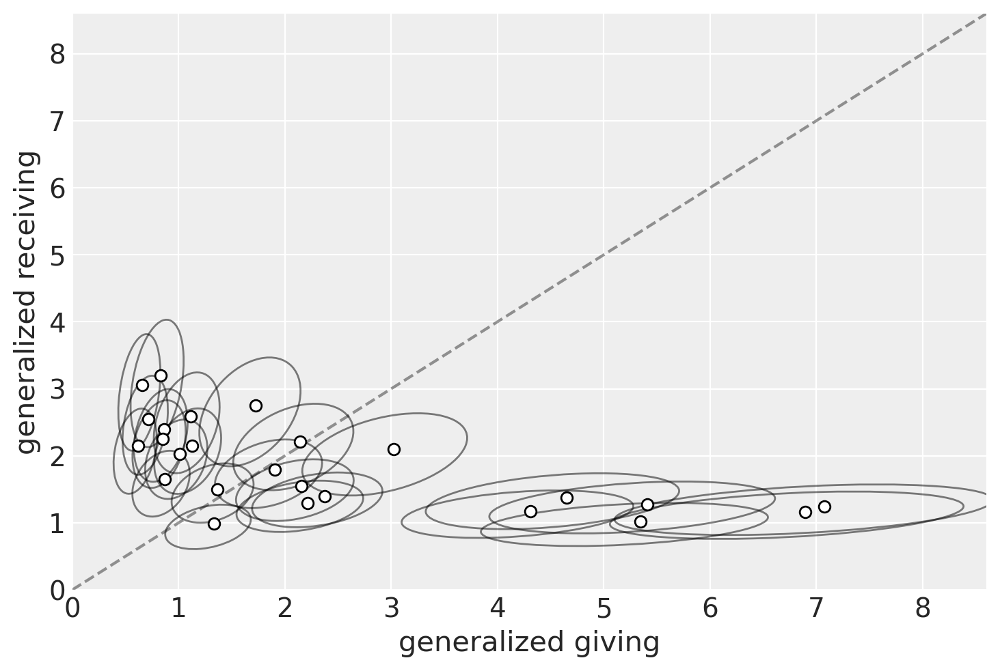

In [40]:
_, ax = plt.subplots(1, 1, constrained_layout=True)
x = np.linspace(0, 9, 101)
ax.plot(x, x, "k--", lw=1.5, alpha=0.4)

# ellipses
for house in range(25):
    Sigma = np.cov(np.stack([np.exp(g[house].values), np.exp(r[house].values)]))
    Mu = np.stack([np.exp(g[house].values.mean()), np.exp(r[house].values.mean())])

    pearson = Sigma[0, 1] / np.sqrt(Sigma[0, 0] * Sigma[1, 1])
    ellipse = Ellipse(
        (0, 0),
        np.sqrt(1 + pearson),
        np.sqrt(1 - pearson),
        edgecolor="k",
        alpha=0.5,
        facecolor="none",
    )
    std_dev = stats.norm.ppf((1 + np.sqrt(0.5)) / 2)
    scale_x = 2 * std_dev * np.sqrt(Sigma[0, 0])
    scale_y = 2 * std_dev * np.sqrt(Sigma[1, 1])
    scale = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y)
    ellipse.set_transform(scale.translate(Mu[0], Mu[1]) + ax.transData)
    ax.add_patch(ellipse)

# household means
ax.plot(Eg_mu, Er_mu, "ko", mfc="white", lw=1.5)

ax.set(
    xlim=(0, 8.6),
    ylim=(0, 8.6),
    xlabel="generalized giving",
    ylabel="generalized receiving",
);

#### Code 14.35

In [41]:
az.summary(trace_14_7, var_names=["Rho_d", "sigma_d"], round_to=2)

/work/home/SamueleSoraggi#7953/Repositories/bayesian_statistics/statistical_rethinking_2/pymc4/pymc4_env_2/lib/python3.10/site-packages/arviz/stats/diagnostics.py:584: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"Rho_d[0, 0]",1.00,0.00,1.00,1.00,0.0,0.0,8000.00,8000.00,NaN
"Rho_d[0, 1]",0.88,0.03,0.83,0.94,0.0,0.0,1816.73,3548.11,1.0
"Rho_d[1, 0]",0.88,0.03,0.83,0.94,0.0,0.0,1816.73,3548.11,1.0
"Rho_d[1, 1]",1.00,0.00,1.00,1.00,0.0,0.0,7842.32,6613.17,1.0
sigma_d[0],1.07,0.07,0.97,1.18,0.0,0.0,1727.51,3671.72,1.0
sigma_d[1],1.13,0.07,1.02,1.23,0.0,0.0,2049.99,3338.75,1.0


#### Code 14.36

In [42]:
dy1 = post["d"].sel({"d_dim_1": 0}).mean(dim=("chain", "draw"))
dy2 = post["d"].sel({"d_dim_1": 1}).mean(dim=("chain", "draw"))

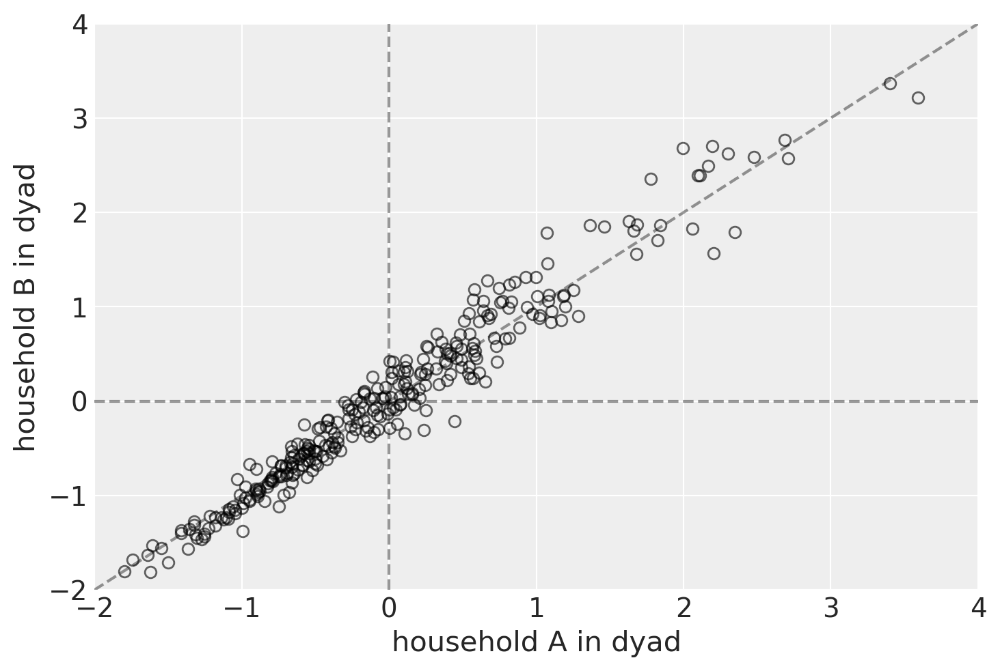

In [43]:
_, ax = plt.subplots(1, 1, constrained_layout=True)
x = np.linspace(-2, 4, 101)

ax.plot(x, x, "k--", lw=1.5, alpha=0.4)
ax.axhline(linewidth=1.5, color="k", ls="--", alpha=0.4)
ax.axvline(linewidth=1.5, color="k", ls="--", alpha=0.4)
ax.plot(dy1, dy2, "ko", mfc="none", lw=1.5, alpha=0.6)

ax.set(
    xlim=(-2, 4),
    ylim=(-2, 4),
    xlabel="household A in dyad",
    ylabel="household B in dyad",
);

## Example 

spatial relationship example using the islands and their distance matrix

#### Code 14.37

In [44]:
Dmat = pd.read_csv("Data/islandsDistMatrix.csv", sep=",", index_col=0)
Dmat.round(1)

,Ml,Ti,SC,Ya,Fi,Tr,Ch,Mn,To,Ha
Malekula,0.0,0.5,0.6,4.4,1.2,2.0,3.2,2.8,1.9,5.7
Tikopia,0.5,0.0,0.3,4.2,1.2,2.0,2.9,2.7,2.0,5.3
Santa Cruz,0.6,0.3,0.0,3.9,1.6,1.7,2.6,2.4,2.3,5.4
Yap,4.4,4.2,3.9,0.0,5.4,2.5,1.6,1.6,6.1,7.2
Lau Fiji,1.2,1.2,1.6,5.4,0.0,3.2,4.0,3.9,0.8,4.9
Trobriand,2.0,2.0,1.7,2.5,3.2,0.0,1.8,0.8,3.9,6.7
Chuuk,3.2,2.9,2.6,1.6,4.0,1.8,0.0,1.2,4.8,5.8
Manus,2.8,2.7,2.4,1.6,3.9,0.8,1.2,0.0,4.6,6.7
Tonga,1.9,2.0,2.3,6.1,0.8,3.9,4.8,4.6,0.0,5.0
Hawaii,5.7,5.3,5.4,7.2,4.9,6.7,5.8,6.7,5.0,0.0


#### Code 14.38

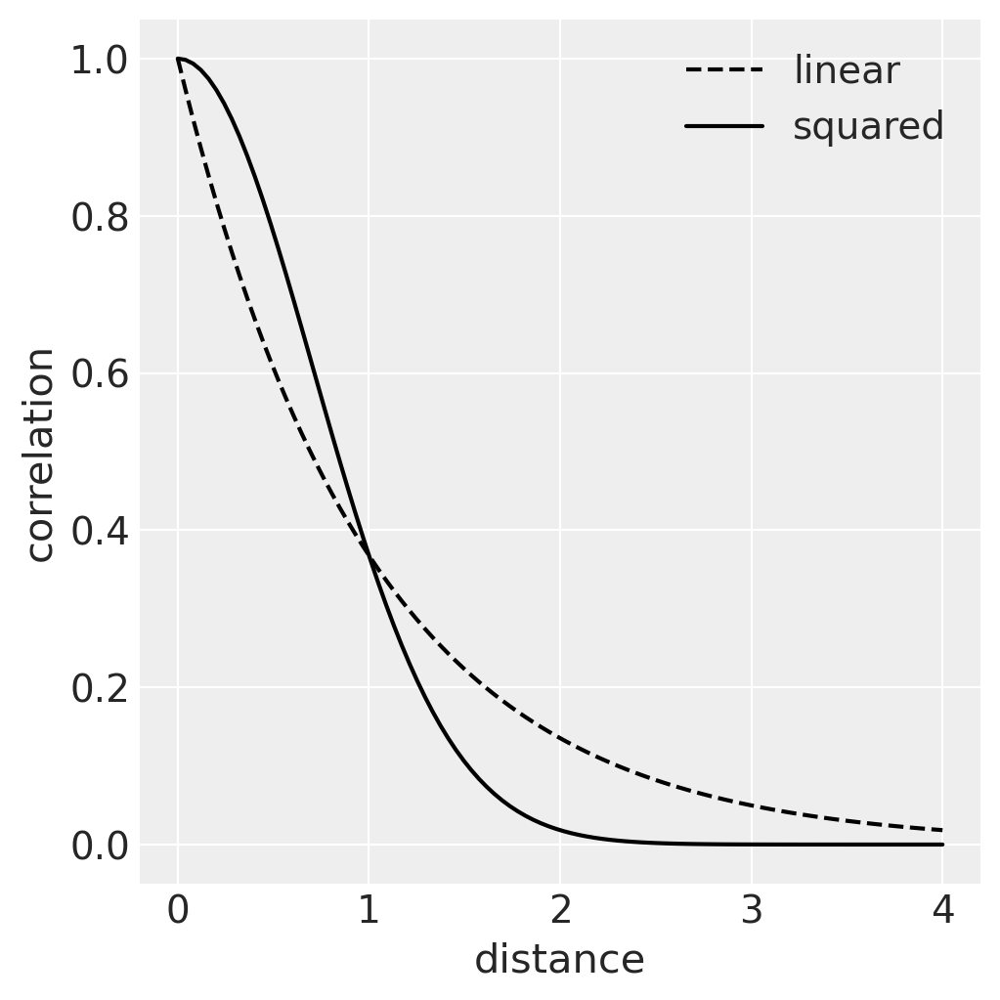

In [45]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))

xrange = np.linspace(0, 4, 100)
# linear
ax.plot(xrange, np.exp(-1 * xrange), "k--", label="linear")
# squared
ax.plot(xrange, np.exp(-1 * xrange**2), "k", label="squared")

ax.set_xlabel("distance")
ax.set_ylabel("correlation")
plt.legend();

#### Code 14.39

In [46]:
# load the ordinary data, now with coordinates
dk = pd.read_csv("Data/Kline2.csv", sep=",")

Nsociety = dk.shape[0]
society = np.arange(Nsociety)
total_tools = dk.total_tools.values

Dmat = Dmat.values
Dmatsq = np.power(Dmat, 2)

P = standardize(np.log(dk.population)).values
P = P + np.abs(P.min()) + 0.1  # must be > 0, see chp 11

dk

,culture,population,contact,total_tools,mean_TU,lat,lon,lon2,logpop
0,Malekula,1100,low,13,3.2,-16.3,167.5,-12.5,7.003065
1,Tikopia,1500,low,22,4.7,-12.3,168.8,-11.2,7.313220
2,Santa Cruz,3600,low,24,4.0,-10.7,166.0,-14.0,8.188689
3,Yap,4791,high,43,5.0,9.5,138.1,-41.9,8.474494
4,Lau Fiji,7400,high,33,5.0,-17.7,178.1,-1.9,8.909235
5,Trobriand,8000,high,19,4.0,-8.7,150.9,-29.1,8.987197
6,Chuuk,9200,high,40,3.8,7.4,151.6,-28.4,9.126959
7,Manus,13000,low,28,6.6,-2.1,146.9,-33.1,9.472705
8,Tonga,17500,high,55,5.4,-21.2,-175.2,4.8,9.769956
9,Hawaii,275000,low,71,6.6,19.9,-155.6,24.4,12.524526


In [48]:
with pm.Model() as m14_8:
    a = pm.Exponential("a", 1.0)
    b = pm.Exponential("b", 1.0)
    g = pm.Exponential("g", 1.0)

    etasq = pm.Exponential("etasq", 2.0)
    ls_inv = pm.HalfNormal("ls_inv", 2.0)
    rhosq = pm.Deterministic("rhosq", 0.5 * ls_inv**2)

    # Implementation with PyMC's GP module:
    cov = etasq * pm.gp.cov.ExpQuad(input_dim=1, ls_inv=ls_inv)
    gp = pm.gp.Latent(cov_func=cov)
    k = gp.prior("k", X=Dmat)

    lam = (a * P**b / g) * at.exp(k[society])

    T = pm.Poisson("total_tools", lam, observed=total_tools)
    
    if(not os.path.exists('trace_14_8.nc')):
        trace_14_8 = pm.sample(4000, tune=2000, target_accept=0.99, random_seed=RANDOM_SEED)
        az.InferenceData.to_netcdf(trace_14_8, 'trace_14_8.nc')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, g, etasq, ls_inv, k_rotated_]


Sampling 4 chains for 2_000 tune and 4_000 draw iterations (8_000 + 16_000 draws total) took 3930 seconds.


In [49]:
trace_14_8 = az.from_netcdf('trace_14_8.nc')

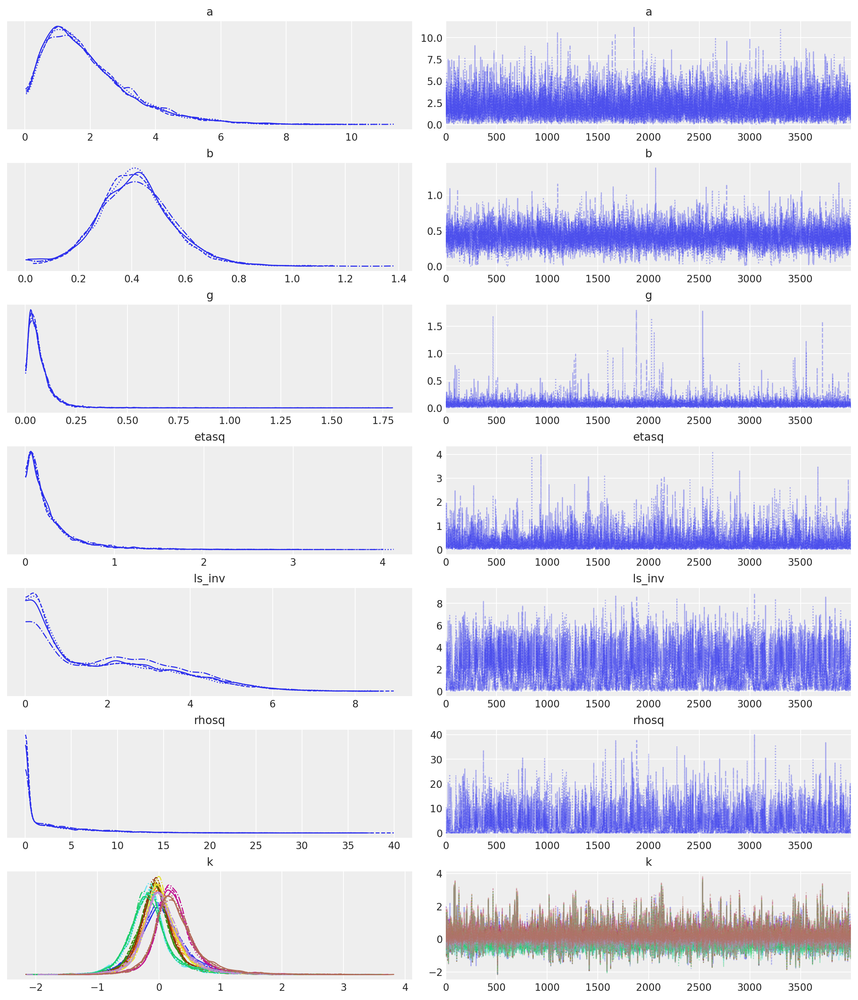

In [50]:
az.plot_trace(trace_14_8, var_names=["~k_rotated_"], compact=True);

#### Code 14.40

In [51]:
az.summary(trace_14_8, var_names=["~k_rotated_"], round_to=2)

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,1.92,1.35,0.12,3.68,0.01,0.01,7715.35,6034.23,1.00
b,0.41,0.14,0.18,0.64,0.00,0.00,4066.52,2588.75,1.00
g,0.07,0.08,0.00,0.13,0.00,0.00,6927.63,6496.90,1.00
etasq,0.28,0.32,0.00,0.60,0.00,0.00,5180.27,7487.75,1.00
ls_inv,1.92,1.61,0.00,4.15,0.05,0.03,1122.22,3804.46,1.01
rhosq,3.14,4.33,0.00,8.60,0.10,0.07,1122.22,3804.46,1.01
k[0],0.06,0.46,-0.63,0.75,0.01,0.00,6194.02,8061.29,1.00
k[1],0.02,0.41,-0.56,0.57,0.00,0.00,8143.69,6133.92,1.00
k[2],-0.04,0.39,-0.58,0.47,0.00,0.00,9136.85,5234.16,1.00
k[3],0.25,0.39,-0.27,0.79,0.00,0.00,9249.02,5634.66,1.00


#### Code 14.41

In [52]:
# compute posterior median covariance
x_seq = np.linspace(0, 10, 100)
post = trace_14_8.posterior.stack(sample=("chain", "draw"))
pmcov_mu = post["etasq"].median().values * np.exp(-post["rhosq"].median().values * (x_seq**2))

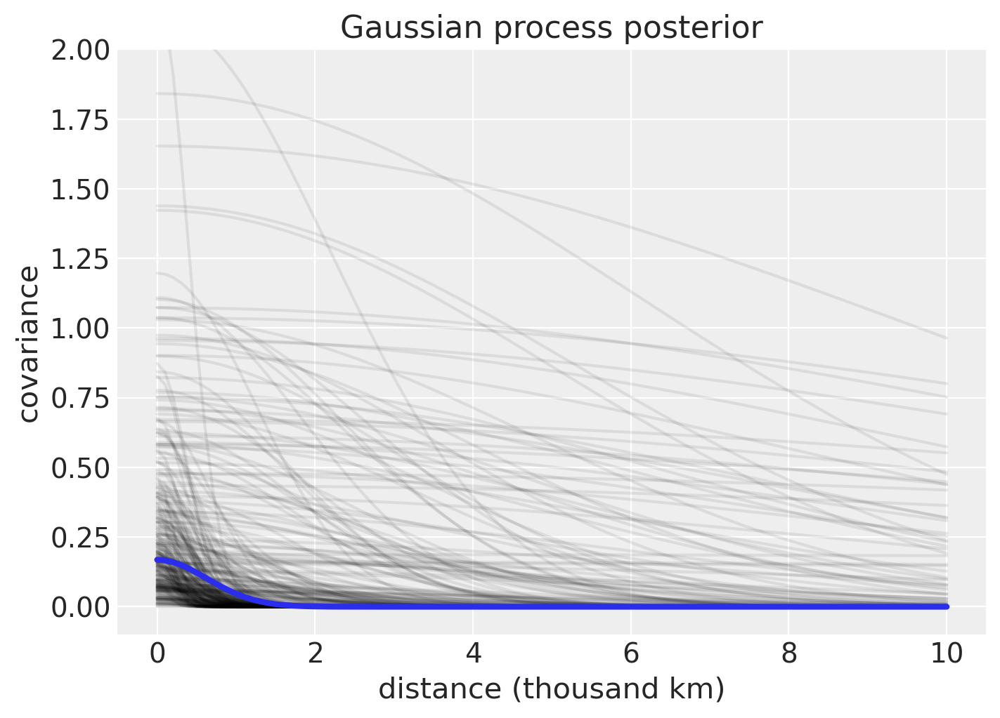

In [53]:
_, ax = plt.subplots(1, 1, figsize=(7, 5))

# plot functions sampled from posterior
ax.plot(
    x_seq,
    (
        post["etasq"][::50].values[:, None]
        * np.exp(-post["rhosq"][::50].values[:, None] * (x_seq**2))
    ).T,
    "k",
    alpha=0.08,
)

# plot median covariance function
ax.plot(x_seq, pmcov_mu, lw=3)

ax.set(
    title="Gaussian process posterior",
    ylim=(-0.1, 2),
    xlabel="distance (thousand km)",
    ylabel="covariance",
);

#### Code 14.42

In [54]:
# compute posterior median covariance among societies
K = post["etasq"].median().values * np.exp(-post["rhosq"].median().values * Dmatsq) + np.diag(
    [0.01] * Nsociety
)

#### Code 14.43

In [55]:
# convert to correlation matrix
sigma_post = np.sqrt(np.diag(K))
Rho = (sigma_post**-1) * K * (sigma_post**-1)

# add row/col names for convenience
Rho = pd.DataFrame(
    Rho,
    index=["Ml", "Ti", "SC", "Ya", "Fi", "Tr", "Ch", "Mn", "To", "Ha"],
    columns=["Ml", "Ti", "SC", "Ya", "Fi", "Tr", "Ch", "Mn", "To", "Ha"],
)

Rho.round(2)

,Ml,Ti,SC,Ya,Fi,Tr,Ch,Mn,To,Ha
Ml,1.00,0.71,0.57,0.00,0.13,0.00,0.00,0.00,0.01,0.0
Ti,0.71,1.00,0.83,0.00,0.13,0.01,0.00,0.00,0.01,0.0
SC,0.57,0.83,1.00,0.00,0.04,0.02,0.00,0.00,0.00,0.0
Ya,0.00,0.00,0.00,1.00,0.00,0.00,0.04,0.03,0.00,0.0
Fi,0.13,0.13,0.04,0.00,1.00,0.00,0.00,0.00,0.45,0.0
Tr,0.00,0.01,0.02,0.00,0.00,1.00,0.01,0.37,0.00,0.0
Ch,0.00,0.00,0.00,0.04,0.00,0.01,1.00,0.14,0.00,0.0
Mn,0.00,0.00,0.00,0.03,0.00,0.37,0.14,1.00,0.00,0.0
To,0.01,0.01,0.00,0.00,0.45,0.00,0.00,0.00,1.00,0.0
Ha,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.0


#### Code 14.44 and 14.45

There seems to be a typo in the book: the posterior predictive computations in the second plot are done according to the model from the first edition: $\lambda = exp(\alpha + \beta_p x logpop)$. We'll use the right version here, i.e the model that we just ran above: $\lambda = \frac{\alpha P^\beta}{\gamma}$.

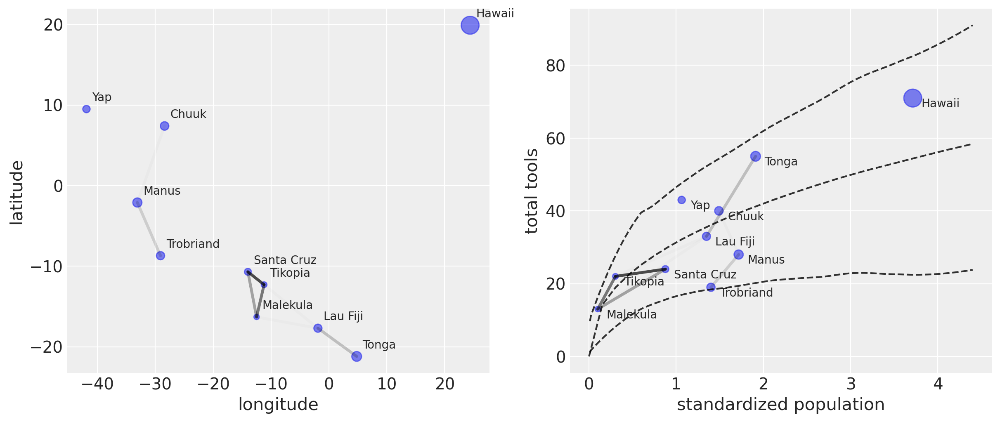

In [56]:
# Code 14.44
# scale point size to logpop
logpop = np.copy(dk["logpop"].values)
logpop /= logpop.max()
psize = np.exp(logpop * 5.5)

_, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# plot raw data and labels
ax0.scatter(dk["lon2"], dk["lat"], psize, alpha=0.6)
labels = dk["culture"].values
for i, itext in enumerate(labels):
    ax0.text(dk["lon2"][i] + 1, dk["lat"][i] + 1, itext)

# overlay lines shaded by Rho
for i in range(10):
    for j in np.arange(i + 1, 10):
        ax0.plot(
            [dk["lon2"][i], dk["lon2"][j]],
            [dk["lat"][i], dk["lat"][j]],
            "k-",
            alpha=Rho.iloc[i, j] ** 2,
            lw=2.5,
        )

ax0.set_xlabel("longitude")
ax0.set_ylabel("latitude")

# Code 14.45
# compute posterior median relationship, ignoring distance
P_seq = np.linspace(-1.4, 3.0, 30) + 1.4  # our little trick from chp 11
lambda_post = (
    post["a"].values[:, None] * P_seq ** post["b"].values[:, None] / post["g"].values[:, None]
)

# plot raw data and labels
ax1.scatter(P, dk["total_tools"], psize, alpha=0.6)
labels = dk["culture"].values
for i, itext in enumerate(labels):
    ax1.text(P[i] + 0.1, dk["total_tools"][i] - 2.5, itext)

# display posterior predictions
ax1.plot(P_seq, np.median(lambda_post, axis=0), "--", color="k", alpha=0.8)
az.plot_hdi(
    P_seq,
    lambda_post,
    color="k",
    ax=ax1,
    fill_kwargs={"alpha": 0},
    plot_kwargs={"color": "k", "ls": "--", "alpha": 0.8},
)

# overlay correlations
for i in range(10):
    for j in np.arange(i + 1, 10):
        ax1.plot(
            [P[i], P[j]],
            [dk["total_tools"][i], dk["total_tools"][j]],
            "k-",
            alpha=Rho.iloc[i, j] ** 2,
            lw=2.5,
        )

ax1.set_xlabel("standardized population")
ax1.set_ylabel("total tools");

#### Code 14.46

Related to Stan. PyMC's GP module automatically reparametrizes with the Cholesky factor of the covariance matrix under the hood.

## Example 

Phylogenetic relationship between primates

#### Code 14.47

The `ape`-package-related computations are very specific to the example and not related to PyMC usage, so let's just load the CSV file and the ready-made image:

In [5]:
Primates301 = pd.read_csv("Data/Primates301.csv", sep=";")

![image](Data/Primates301.png)

#### Code 14.48

In [6]:
dpymc = Primates301.dropna(subset=["group_size", "body", "brain"])
spp_obs = dpymc["name"]
dpymc

,name,genus,species,subspecies,spp_id,genus_id,social_learning,research_effort,brain,body,group_size,gestation,weaning,longevity,sex_maturity,maternal_investment
0,Allenopithecus_nigroviridis,Allenopithecus,nigroviridis,NaN,1,1,0.0,6.0,58.02,4655.0,40.00,NaN,106.15,276.0,NaN,NaN
2,Alouatta_belzebul,Alouatta,belzebul,NaN,3,3,0.0,15.0,52.84,6395.0,7.40,NaN,NaN,NaN,NaN,NaN
3,Alouatta_caraya,Alouatta,caraya,NaN,4,3,0.0,45.0,52.63,5383.0,8.90,185.92,323.16,243.6,1276.72,509.08
4,Alouatta_guariba,Alouatta,guariba,NaN,5,3,0.0,37.0,51.70,5175.0,7.40,NaN,NaN,NaN,NaN,NaN
5,Alouatta_palliata,Alouatta,palliata,NaN,6,3,3.0,79.0,49.88,6250.0,13.10,185.42,495.60,300.0,1578.42,681.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,Trachypithecus_obscurus,Trachypithecus,obscurus,NaN,295,67,0.0,6.0,62.12,7056.0,10.00,146.63,362.93,300.0,NaN,509.56
295,Trachypithecus_phayrei,Trachypithecus,phayrei,NaN,296,67,0.0,16.0,72.84,7475.0,12.90,180.61,305.87,NaN,NaN,486.48
296,Trachypithecus_pileatus,Trachypithecus,pileatus,NaN,297,67,0.0,5.0,103.64,11794.0,8.50,NaN,NaN,NaN,NaN,NaN
298,Trachypithecus_vetulus,Trachypithecus,vetulus,NaN,299,67,0.0,2.0,61.29,6237.0,8.35,204.72,245.78,276.0,1113.70,450.50


#### Code 14.49

In [7]:
N_spp = len(dpymc)
M = standardize(np.log(dpymc.body.values))
B_ = standardize(np.log(dpymc.brain.values))
G = standardize(np.log(dpymc.group_size.values))
Imat = np.diag(np.ones(N_spp))

In [8]:
with pm.Model() as m14_9:
    a = pm.Normal("a", 0.0, 1.0)
    bM = pm.Normal("bM", 0.0, 0.5)
    bG = pm.Normal("bG", 0.0, 0.5)
    sigma_sq = pm.Exponential("sigma_sq", 1.0)

    mu = a + bM * M + bG * G
    SIGMA = Imat * sigma_sq
    B = pm.MvNormal("B", mu, cov=SIGMA, observed=B_)

    if(not os.path.exists('trace_14_9.nc')):
        trace_14_9 = pm.sample(random_seed=RANDOM_SEED)
        az.InferenceData.to_netcdf(trace_14_9, 'trace_14_9.nc')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bG, sigma_sq]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 997 seconds.


In [9]:
trace_14_9 = az.from_netcdf('trace_14_9.nc')
az.summary(trace_14_9, round_to=2)

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,0.00,0.02,-0.03,0.03,0.0,0.0,4283.18,2985.00,1.0
bM,0.89,0.02,0.86,0.93,0.0,0.0,2526.05,2828.62,1.0
bG,0.12,0.02,0.09,0.16,0.0,0.0,2705.94,2727.04,1.0
sigma_sq,0.05,0.01,0.04,0.06,0.0,0.0,3777.03,3015.92,1.0


#### Code 14.50

The `ape`-package-related computations are very specific to the example and not related to PyMC usage, so let's just load the CSV files:

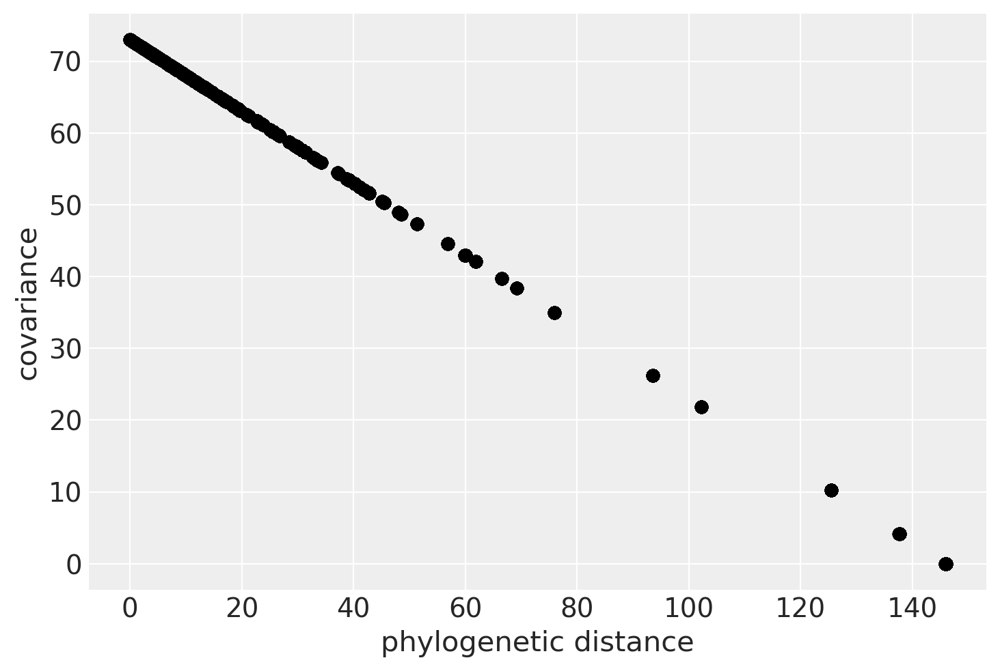

In [10]:
V = pd.read_csv("Data/Primates301_vcov_matrix.csv", index_col=0)
Dmat = pd.read_csv("Data/Primates301_distance_matrix.csv", index_col=0)

plt.plot(Dmat, V, "ko")
plt.xlabel("phylogenetic distance")
plt.ylabel("covariance");

#### Code 14.51

In [11]:
# put species in right order
V_ord = V.loc[spp_obs, spp_obs]
# convert to correlation matrix
R = (V_ord / V_ord.max()).values

In [12]:
# Brownian motion model
with pm.Model() as m14_10:
    a = pm.Normal("a", 0.0, 1.0)
    bM = pm.Normal("bM", 0.0, 0.5)
    bG = pm.Normal("bG", 0.0, 0.5)
    sigma_sq = pm.Exponential("sigma_sq", 1.0)

    mu = a + bM * M + bG * G
    SIGMA = R * sigma_sq
    B = pm.MvNormal("B", mu, cov=SIGMA, observed=B_)
    
    if(not os.path.exists('trace_14_10.nc')):
        trace_14_10 = pm.sample(random_seed=RANDOM_SEED)
        az.InferenceData.to_netcdf(trace_14_10, 'trace_14_10.nc')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bG, sigma_sq]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 938 seconds.


In [13]:
trace_14_10 = az.from_netcdf('trace_14_10.nc')
az.summary(trace_14_10, round_to=2)

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a,-0.19,0.17,-0.45,0.08,0.0,0.0,5696.55,3062.10,1.0
bM,0.70,0.04,0.64,0.76,0.0,0.0,5906.64,3435.97,1.0
bG,-0.01,0.02,-0.05,0.02,0.0,0.0,4672.62,2755.63,1.0
sigma_sq,0.16,0.02,0.13,0.19,0.0,0.0,5092.72,3182.21,1.0


#### Code 14.52

In [14]:
# scale and reorder distance matrix
Dmat_ord = (Dmat.loc[spp_obs, spp_obs] / Dmat.loc[spp_obs, spp_obs].max()).values

This is a good opportunity to show a use-case of PyMC's GP module. In the Oceanic tools example above, we didn't need a mean function (which means it was automatically set to 0 by PyMC). Now however, we need both a mean function _and_ a covariance function to specify our GP. The covariance function will look familiar. For the mean function, we could use `gp.mean.Linear`, which takes as input a matrix of coefficients and a vector of intercepts. But that mean function would then be evaluated on our distance matrix, as `SIGMA` will be.

We don't want that -- we only want the mean function to depend on `M` and `G` not on the phylogenetic distance. We can easily [define a custom mean function](https://docs.pymc.io/notebooks/GP-MeansAndCovs.html#Defining-a-custom-mean-function) in PyMC. We just need to subclass `pm.gp.mean.Mean` and provide `__call__` and `__init__` methods:

In [15]:
class LinearMean(pm.gp.mean.Mean):
    def __init__(self, intercept, slopes):
        self.intercept = intercept
        self.slopes = slopes

    def __call__(self, X):
        """In the trace summary, b0 will be bM and b1 will be bG"""
        return self.intercept + self.slopes[0] * M + self.slopes[1] * G

And we can easily use this function in our model below. Notice we use `pm.gp.Marginal` and `gp.marginal_likelihood` instead of `pm.gp.Latent` and `gp.prior` as in the Oceanic tools example. It's because here we have a (multivariate) normal likelihood, which works well analytically with a GP prior, so `Marginal` and `marginal_likelihood` just take advantage of the closed-form solution to speed-up computations. It's also why you see no calls to `pm.MvNormal` below: this is implicit in `marginal_likelihood`, which evaluates the GP at the `X` points (`Dmat_ord`). And do you recall what the evaluation of a GP is? An MvNormal random variable -- bingo!

In [16]:
with pm.Model() as m14_11:
    a = pm.Normal("a", 0.0, 1.0)
    b = pm.Normal("b", 0.0, 0.5, shape=2)
    # specify the mean function:
    mu = LinearMean(intercept=a, slopes=b)

    # half_normal(1, 0.25) is too strong
    etasq = pm.Exponential("etasq", 1.0)
    rhosq = pm.Normal("rhosq", 3.0, 0.25)
    # specify the covariance function:
    SIGMA = etasq * pm.gp.cov.Exponential(input_dim=1, ls=rhosq)

    # specify the GP:
    gp = pm.gp.Marginal(mean_func=mu, cov_func=SIGMA)

    # place a GP prior over the observations.
    # SIGMA will be conditioned on Dmat_ord.
    # mu won't be, as we coded it on purpose.
    sigma = pm.Exponential("sigma", 1.0)
    B = gp.marginal_likelihood("B", X=Dmat_ord, y=B_, noise=sigma)

    if(not os.path.exists('trace_14_11.nc')):
        trace_14_11 = pm.sample(2000, tune=2000, target_accept=0.9, random_seed=RANDOM_SEED)
        az.InferenceData.to_netcdf(trace_14_11, 'trace_14_11.nc')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, etasq, rhosq, sigma]


ValueError: Not enough samples to build a trace.

In [ ]:
trace_14_11 = az.from_netcdf('trace_14_11.nc')
# b0 is bM and b1 is bG
az.summary(trace_14_11, round_to=2)

All the posteriors are looking good and similar to the book, except for `etasq`. If you replace `etasq = pm.Exponential('etasq', 1.0)` by  `etasq = pm.Normal('etasq', 1.0, 0.25)`, you will see that this prior is too strong and is not moved by the data, which is why I changed it. Moreover, I don't understand how the results for `etasq` reported in the book could be so close to 0 ($[0.03, 0.05]$), especially with a prior as strong as `half_normal(1, 0.25)`.

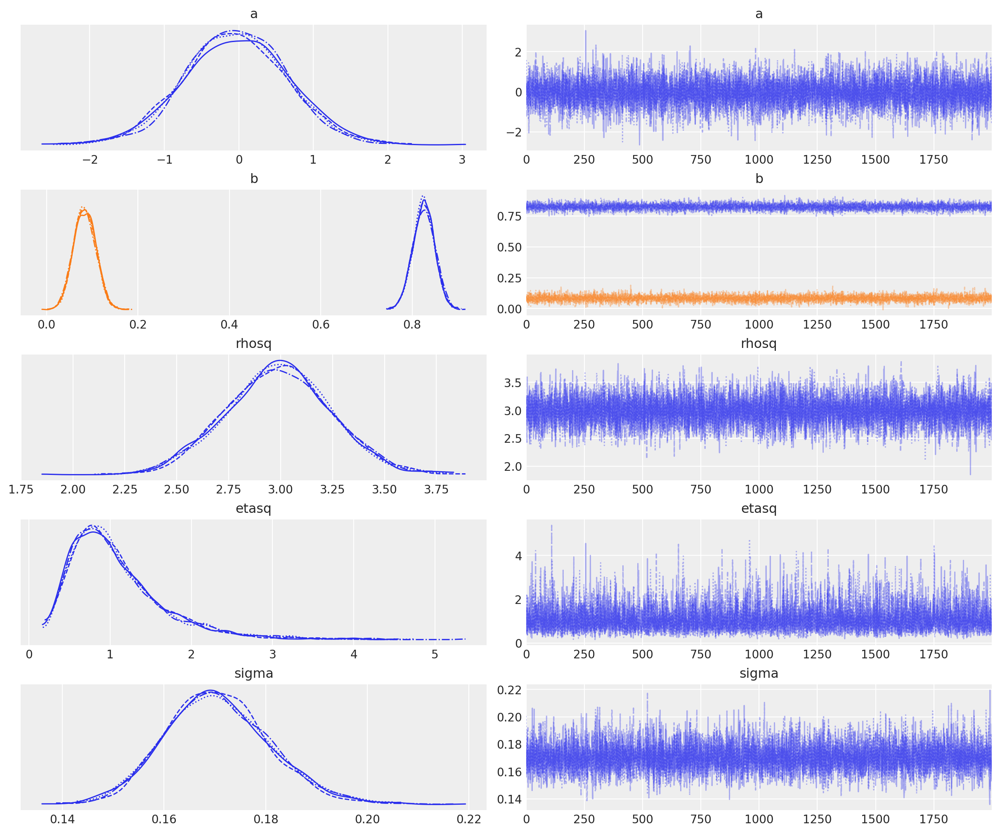

In [82]:
az.plot_trace(trace_14_11, compact=True);

#### Code 14.53

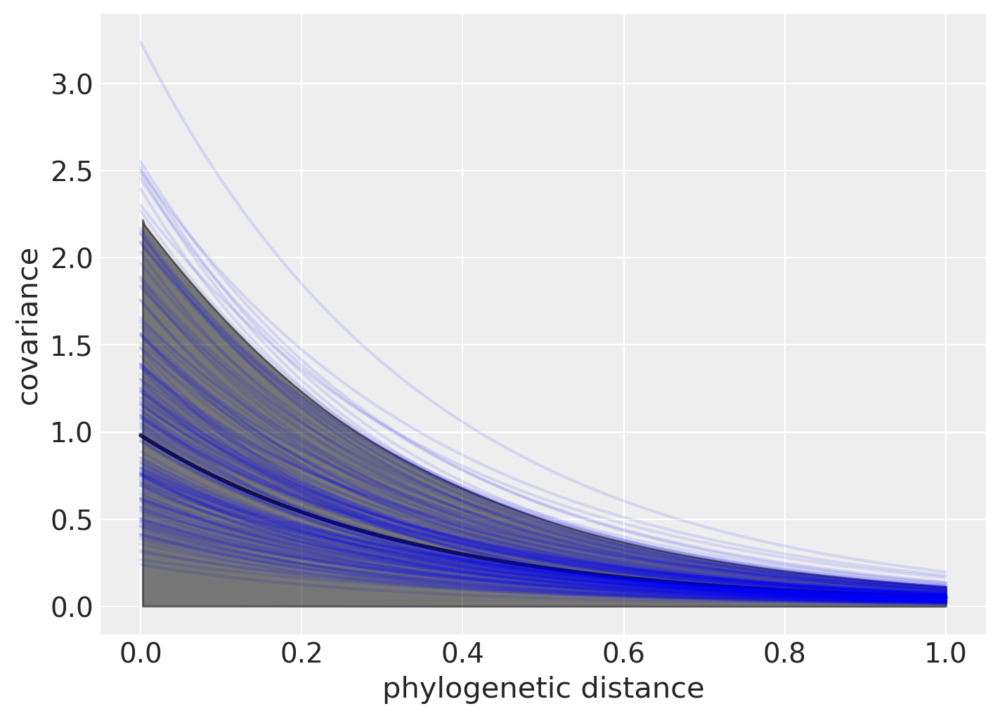

In [83]:
d_seq = np.linspace(0, Dmat_ord.max(), 100)
post = trace_14_11.posterior.stack(sample=("chain", "draw"))

_, ax = plt.subplots(1, 1, figsize=(7, 5))

# prior mean and 89% interval
eta = np.random.exponential(1.0, 1000)
rho = np.random.normal(3.0, 0.25, 1000)
K = []
for d in d_seq:
    K.append(eta * np.exp(-rho * d))
K = np.asarray(K)

ax.plot(d_seq, K.mean(1), "k", alpha=0.8, lw=2)
az.plot_hdi(d_seq, K.T, color="k", ax=ax)

# posterior
post_etasq = post["etasq"][::50].values[:, None]
post_rhosq = post["rhosq"][::50].values[:, None]
ax.plot(d_seq, (post_etasq * np.exp(-post_rhosq * d_seq)).T, "b", alpha=0.1)

ax.set(xlabel="phylogenetic distance", ylabel="covariance");

In [17]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Tue Dec 12 2023

Python implementation: CPython
Python version       : 3.10.9
IPython version      : 8.11.0

pymc      : 4.3.0
pandas    : 1.5.3
numpy     : 1.24.2
aesara    : 2.8.7
matplotlib: 3.7.1
scipy     : 1.10.1
arviz     : 0.13.0

Watermark: 2.3.1

